# Θέμα: Εκτίμηση Οπτικής Ροής (Optical Flow) και Εξαγωγή Χαρακτηριστικών σε Βίντεο για Αναγνώριση Δράσεων

## Παρακολούθηση Προσώπου και Χεριών με Χρήση του Πεδίου Οπτικής Ροής με τη μέθοδο Lucas-Kanade

Βλάχος Ιωάννης, 03115013, 10ο εξάμηνο, ΣΗΜΜΥ, ΕΜΠ

Ακαδημαϊκό Έτος 2019-2020, ροή Σ, εαρινό εξάμηνο

Στο παρόν notebook υπάρχουν όλα τα ζητούμενα του πρώτου μέρους όπως τα plots, όλος ο κώδικας που χρησιμοποιήθηκε και επεξηγήσεις της διαδικασίας που ακολουθήθηκε. Η αναφορά του πρώτου μέρους μαζί με του δεύτερου αποστέλλεται μαζί με το 2ο μέρος.

# 1.1 Ανίχνευση Δέρματος Προσώπου και Χεριών

In [1]:
from scipy import ndimage
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

Διαβάζουμε τις αποχρώσεις του δέρματος από το .mat αρχείο.

In [2]:
import scipy.io
mat = scipy.io.loadmat('SkinSamplesRGB.mat')

In [3]:
skin_samples = mat['skinSamplesRGB']

Κρατάμε τις αποχρώσεις Cb Cr.

In [4]:
import cv2

#skin_samples=cv2.cvtColor(skin_samples, cv2.COLOR_BGR2YCR_CB)[:,:,1:]
skin_samples.shape

(22, 81, 3)

Διαβάζουμε ένα από τα στιγμιότυπα ως εικόνες.

In [5]:
import matplotlib.pyplot as plt

BGRImage = cv2.imread('GreekSignLanguage/6.png')

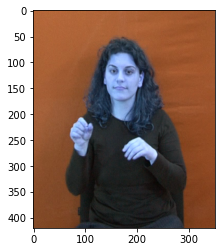

In [6]:
plt.imshow(BGRImage)

Μετατρέπουμε την εικόνα σε κλίμακα YCbCr ώστε να μπορούμε να συγκρίνουμε με τις δεδομένες αποχρώσεις δέρματος.

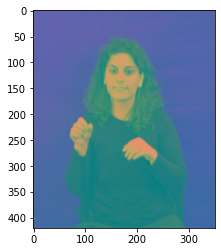

In [7]:
img = cv2.cvtColor(BGRImage, cv2.COLOR_BGR2YCR_CB)
plt.imshow(img)

In [8]:
img[0].mean()

121.74380952380952

Υπολογίζουμε τον πίνακα μέσων τιμών υπολογίζοντας τη μέση τιμή της Cr και Cb συνιστώσας αντίστοιχα.

In [9]:
import numpy as np

m_cr = np.mean(skin_samples[:,:,0])
m_cb = np.mean(skin_samples[:,:,1])

m = [m_cr, m_cb]
m

[245.2216610549944, 192.33501683501683]

Για τον πίνακα συνδιασπορών μετατρέπουμε τις 2 συνιστώσες σε μονοδιάστατους πίνακες ώστε να μπορέσουμε να καλέσουμε την cov της numpy. 

In [10]:
cr = np.vstack(skin_samples[:,:,0]).reshape([skin_samples.shape[0]*skin_samples.shape[1]])
cb = np.vstack(skin_samples[:,:,1]).reshape([skin_samples.shape[0]*skin_samples.shape[1]])

print(cr.shape)
print(cb.shape)

Sigma = np.cov(np.array([cr, cb]),bias=False)
print(Sigma)

(1782,)
(1782,)
[[206.56117006 288.95770261]
 [288.95770261 553.56260244]]


Υπολογίζουμε στη συνέχεια την γκαουσιανή κατανομή δίνοντας ως όρισμα τον πίνακα μέσων τιμών και συνδιασπορών.

In [11]:
from scipy.stats import multivariate_normal

y = multivariate_normal.pdf(img[:,:,1:], mean=m, cov=Sigma)

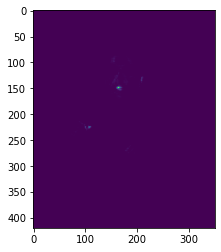

In [12]:
plt.imshow(y)

In [13]:
y.max()

3.987734818108711e-09

Θεωρώντας ένα πού μικρό threshold κρατάμε τα σημεία των οποίων η πιθανότητα να είναι δέρμα υπερτερεί αυτού του threshold και τα θέτουμε μονάδα.

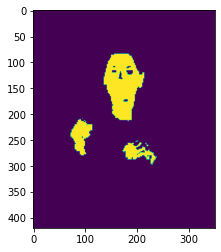

In [14]:
threshold = 0.0000000000000001
binary_image = np.where(y>threshold, 1, 0).astype(np.uint8) 
plt.imshow(binary_image)

In [15]:
binary_image.sum()

9303

Εφαρμόζουμε κατά σειρά τις πράξεις opening και closing.

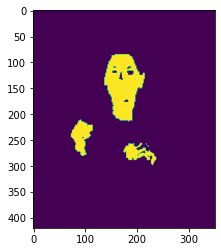

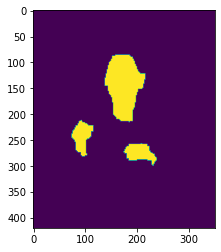

In [16]:
opening_kernel = np.ones((2,2),np.uint8)
closing_kernel = np.ones((20,20),np.uint8)

opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, opening_kernel)

plt.imshow(opening)
plt.show()
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, closing_kernel)

plt.imshow(closing)

Καλούμε τέλος την label η οποία ανιχνεύει τα 3 τελικά σχήματα της εικόνας.

In [17]:
from scipy.ndimage import label

print(label(closing))

(array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]]), 3)


Συνοψίζουμε την παραπάνω διαδικασία στην ζητούμενη συνάρτηση με όρισμα την μέση τιμή και τη συνδιασπορά, όπως και την εικόνα.

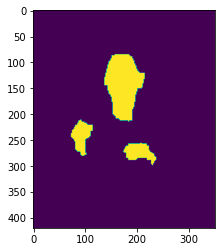

In [18]:
def fd(I, mu, cov):
    
    y = multivariate_normal.pdf(I[:,:,1:], mean=mu, cov=cov)
    
    threshold =  0.0000000000000001
    binary_image = np.where(y>threshold, 1, 0).astype(np.uint8)
    
    opening_kernel = np.ones((2,2),np.uint8)
    closing_kernel = np.ones((15,15),np.uint8)
    
    opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, opening_kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, closing_kernel)
    
    plt.imshow(closing)
    return label(closing)
    
    #return [x, y, width, height]

boundingBox = fd(img, m, Sigma)

In [19]:
boundingBox

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]), 3)

Η συνάρτηση rectangle δέχεται ως όρισμα το αποτέλεσμα της label και τον αριθμό του αντίστοιχου σχήματος που επιθυμούμε να ανιχνεύσουμε μαζί με έναν παράγοντα epsilon που προσθέτουμε δεξιά και αριστερά από το ανιχνευθέν σχήμα ώστε να περιβάλλεται εμφανώς όλη η περιοχή δέρματος.

In [20]:
def rectangle(Box, a, epsilon):
    b = np.where(Box[0]==a)
    x = b[1].min() - epsilon
    y = b[0].min() - epsilon
    width = b[1].max() - x + epsilon
    height = b[0].max() - y + epsilon
    return [x, y, width, height]

Καλούμε τη συνάρτηση για τα 3 σχήματα δέρματος: πρόσωπο, δεξύ και αριστερό χέρι.

In [21]:
face = rectangle(boundingBox, 1, 0)
print("face", face)
left_hand = rectangle(boundingBox, 2, 0)
print("left hand", left_hand)
right_hand = rectangle(boundingBox, 3, 0)
print("right hand", right_hand)

face [137, 85, 77, 129]
left hand [73, 211, 41, 69]
right hand [173, 256, 63, 42]


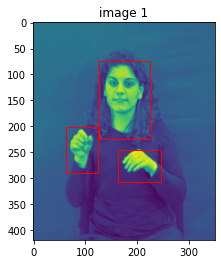

In [22]:
import os

[startx, starty, width, height] = rectangle(boundingBox, 3, 10)

arr = os.listdir('./GreekSignLanguage')

I = cv2.imread('GreekSignLanguage/6.png', cv2.IMREAD_GRAYSCALE)

I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

I1 = I[starty:starty+height, startx:startx+width]
plt.imshow(I)

rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
plt.gca().add_patch(rect)

rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
plt.gca().add_patch(rect)


[startx, starty, width, height] = rectangle(boundingBox, 2, 10)
rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
plt.gca().add_patch(rect)

[startx, starty, width, height] = rectangle(boundingBox, 1, 10)
rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
plt.gca().add_patch(rect)

plt.title("image 1")
plt.show()

# 1.2 Παρακολούθηση Προσώπου και Χεριών

# 1.2.1 Υλοποίηση του Αλγόριθμου των Lucas-Kanade

Κρατάμε τις τιμές που δίνονται στην αναφορά.

In [23]:
face = [138, 88, 73, 123]
left_hand =  [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]

Εκτελούμε αναλυτικά τα βήματα του θεωτηρικού μέρους της αναφοράς.

In [215]:
def lk(I1, I2, rho, epsilon, d_x0, d_y0):
    
    #οι άξονες των εικόνων
    x_0,y_0 = np.meshgrid(range(I1.shape[1]),range(I1.shape[0]))
    
    #φέρνουμε τις εικόνες σε μονοδιάστατη μορφή ώστε να μπορέσουμε να κάνουμε αλλαγή μεταβλητών και 
    #κάνουμε reshape
    In_1 = ndimage.map_coordinates(I1,np.array([np.ravel(y_0+d_y0), np.ravel(x_0+d_x0)]))
    In_1 = In_1.reshape((I1.shape))
    
    #υπολογίζουμε τις παραγώγους.
    dIn_1x, dIn_1y = np.gradient(In_1.reshape((I1.shape)))
    dIn_1x = dIn_1x.reshape((I1.shape))
    dIn_1y = dIn_1y.reshape((I1.shape))
    
    #κάνουμε πάλι αλλαγή μεταβλητής αφού φέρουμε σε μονοδιάστατη μορ΄φή τις παραγώγους και μετά κάνουμε reshape
    A1 = ndimage.map_coordinates(dIn_1x,np.array([np.ravel(y_0+d_y0), np.ravel(x_0+d_x0)]))
    A2 = ndimage.map_coordinates(dIn_1y,np.array([np.ravel(y_0+d_y0), np.ravel(x_0+d_x0)]))
    
    A1 = A1.reshape((I1.shape))
    A2 = A2.reshape((I1.shape))
    
    #Σύμφωνα με τους ορισμούς υπολογίζουμε τα Ε και Α
    A = [A1, A2]
    
    E = I2 - In_1
                    
    #ορίζουμε την γκαουσιανή και από το μήκος υπολογίζουμε την αντίστοιχη διασπορά
    G = cv2.getGaussianKernel(rho, (rho-1)/6) 
    
    #υπολογίζουμε τα 4 στοιχεία του πρώτου 2χ2 πίνακα 
    x = cv2.filter2D(A1**2, -1, G)+epsilon
    y = cv2.filter2D(A1*A2, -1, G)
    z = cv2.filter2D(A1*A2, -1, G)
    w = cv2.filter2D(A2**2, -1, G)+epsilon
    
    #υπολογίζουμε και τα 2 στοιχεία του δεύτερου πίνακα
    a = cv2.filter2D(A1*E, -1, G)
    b = cv2.filter2D(A2*E, -1, G)
    
    #όλες οι πράξεις γίνονται element wise
    #υπολογίζουμε έτσι την ορίζουσα και ύστερα τον αντίστροφο από τον ορ΄ισμό.
    det = x*w - y*z
    ux = (w*a - y*b) / det
    uy = (b*x - z*a) / det
    
    #προσθέτουμε την μετατόπιση στο αρχικό διάνυσμα
    dx = d_x0 + ux
    dy = d_y0 + uy
    
    return dx, dy

Εκτελούμε την παραάνω συνάρτηση για 10 επαναλήψεις αρχικοποιώντας τα διανύσματα μετατόπισης στο 0.

In [216]:
def find_d(I1, I2, rho, epsilon, converge=10):
    x_0,y_0 = np.meshgrid(range(I1.shape[1]),range(I1.shape[0]))
    dx,dy = np.meshgrid(np.zeros(I1.shape[1]),np.zeros(I1.shape[0]))
    #dx,dy = np.meshgrid(np.random.rand(I1.shape[1]),np.random.rand(I1.shape[0]))
    #dx,dy = np.meshgrid(range(I1.shape[1]),range(I1.shape[0]))
    #dx,dy = np.meshgrid(np.ones(I1.shape[1]),np.ones(I1.shape[0]))
    for i in range(converge):
        dx, dy = lk(I1, I2, rho, epsilon, dx, dy)
    
    dx_r=cv2.resize(dx, None, fx=0.3, fy=0.3)
    dy_r=cv2.resize(dy, None, fx=0.3, fy=0.3)
    
    x = range(dx_r.shape[1])
    y = range(dx_r.shape[0])
    
    plt.quiver(x, y, -dx_r, -dy_r)
    plt.gca().set_aspect('equal')
    plt.gca().invert_yaxis()
    plt.show()
    '''
    plt.quiver(x_0, y_0, -dx, -dy)
    plt.gca().invert_yaxis()
    plt.show()
    '''
    return dx, dy

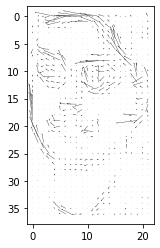

In [241]:
st=face

startx = st[0]
starty = st[1]
width = st[2]
height = st[3]

I = cv2.imread('GreekSignLanguage/1.png', cv2.IMREAD_GRAYSCALE)
I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
I1 = I[starty:starty+height, startx:startx+width]

I = cv2.imread('./GreekSignLanguage/2.png', cv2.IMREAD_GRAYSCALE)
I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
I2 = I[starty:starty+height, startx:startx+width]

dx, dy = find_d(I1, I2, 10, 0.1, 5)

In [242]:
print(dx.max())
dy.max()

1.5626477301120758


0.5935693383216858

# 1.2.2

Παίρνουμε τη μέγιστη από τις ενέργειες των pixels. Υπολογίζουμε ύστερα το threshold ως ένα ποσοστό αυτού του μεγίστου πχ 0,9. Μετά παίρνουμε τον μέσο όρο όλων των pixels με ενέργειες που υπερβαίνουν αυτό το κατώφλι. Παίρνουμε δηλαδή το μέσο όρο των μετατοπίσεων που είναι αρκετά μεγάλες σε τιμή ορίζοντας ένα κατώφλι που να μας βολεύει.

In [243]:
def displ(dx, dy, thres):
    #print(np.mean(dx), np.mean(dy))
    E = dx**2 + dy**2
    plt.imshow(E)
    #plt.show()
    t = thres*np.max(E)
    #print(t)
    #print(E.max())
    plt.imshow(np.where(E>t,1,0))
    a = np.sum(np.where(E > t, 1, 0))
    ma = np.sum(np.where(E > t, dx, 0)) / a
    mb = np.sum(np.where(E > t, dy, 0)) / a
    #print(ma, mb)
    return int(np.round(ma)), int(np.round(mb))

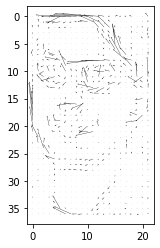

(1, -1)

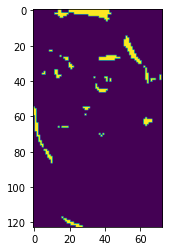

In [244]:
dx, dy = find_d(I1, I2, 4, 0.1)

displ(dx,dy,0.1)

In [245]:
dy.sum()

-624.214024450846

Συνολικός αριθμός εικόνων.

In [246]:
total = len(os.listdir('./GreekSignLanguage'))

Εφαρμόζουμε όλα τα παραπάνω αλλά για αλληλουχία εικόνων. Ξαναγράφουμε τις συναρτήσεις ώστε να μπορούμε να κάνουμε subplot.

Χρησιμοποιούμε επίσης τη συνάρτηση step ώστε να εξασφαλίσουμε ότι 

In [290]:
def step(x):
    if x>0:
        return x
    else:
        return 0

def find_d(I1, I2, rho, epsilon, ax1, converge=10):
    x_0,y_0 = np.meshgrid(range(I1.shape[1]),range(I1.shape[0]))
    dx,dy = np.meshgrid(np.zeros(I1.shape[1]),np.zeros(I1.shape[0]))
    #dx,dy = np.meshgrid(np.random.rand(I1.shape[1]),np.random.rand(I1.shape[0]))
    #dx,dy = np.meshgrid(range(I1.shape[1]),range(I1.shape[0]))
    #dx,dy = np.meshgrid(np.ones(I1.shape[1]),np.ones(I1.shape[0]))
    for i in range(converge):
        dx, dy = lk(I1, I2, rho, epsilon, dx, dy)
    
    dx_r=cv2.resize(dx, None, fx=0.3, fy=0.3)
    dy_r=cv2.resize(dy, None, fx=0.3, fy=0.3)
    
    x = range(dx_r.shape[1])
    y = range(dx_r.shape[0])
    
    ax1.quiver(x, y, -dx_r, -dy_r)
    ax1.set_aspect('equal')
    ax1.invert_yaxis()
    #ax1.show()
    '''
    plt.quiver(x_0, y_0, -dx, -dy)
    plt.gca().invert_yaxis()
    plt.show()
    '''
    return dx, dy
    
    
def displ(dx, dy, thres, ax2):
    #print(np.mean(dx), np.mean(dy))
    E = dx**2 + dy**2
    ax2.imshow(E)
    #plt.show()
    t = thres*np.max(E)
    #print(t)
    #print(E.max())
    a = np.sum(np.where(E > t, 1, 0))
    ma = np.sum(np.where(E > t, dx, 0)) / a
    mb = np.sum(np.where(E > t, dy, 0)) / a
    #print(ma, mb)
    return int(np.round(ma)), int(np.round(mb))
    
def display(start, rho, epsilon, thresh_percent):
    
    startx = start[0]
    starty = start[1]
    width = start[2]
    height = start[3]
    arr = os.listdir('./GreekSignLanguage')
    
    I = cv2.imread('GreekSignLanguage/1.png', cv2.IMREAD_GRAYSCALE)
    
    I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
    I1 = I[starty:starty+height, startx:startx+width]
    plt.imshow(I)
    
    rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')

    print(startx, starty)
    # Add the patch to the Axes
    plt.gca().add_patch(rect)
    plt.title("image 1")
    plt.show()
    
    for i in range(2, total+1):
    
        f, (ax1, ax2, ax3) = plt.subplots(1, 3)

        #διαβάζω τις εικόνες, τις κάνω normalize και επιλέγω το χωρίο που έχει ανιχνευθεί το χαρακτηριστικό
        I = cv2.imread('./GreekSignLanguage/'+str(i)+'.png', cv2.IMREAD_GRAYSCALE)
        I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        
        I2 = I[starty:starty+height, startx:startx+width]

        #οι μετατοπίσεις όπως υπολογίστηκαν αναλυτικά
        dx, dy = find_d(I1, I2, rho, epsilon, ax1)

        #τα pixels που πρέπει να μετακινηθούμε κατα χ και κατά υ
        movex, movey = displ(dx, dy, thresh_percent, ax2)
        
        #print(movex,movey)
        
        #οι νέες θέσεις εκκίνησης
        startx, starty = step(startx+movex), step(starty+movey)
        
        #startx, starty = movex, movey
        print(startx,starty)
        ax3.imshow(I)

        rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')

        # Add the patch to the Axes
        plt.gca().add_patch(rect)
        ax3.title.set_text('image' + str(i))
        plt.show()
        
        I1 = I2
    return dx,dy

Τα αποτελέσματα για τα 3 χαρακτηριστικά φαίνονται παρακάτω. Αντίστοιχα για πρόσωπο, αριστερό και δεξύ χέρι:

Μαζί τυπώνουμε και τις συντεταγμένες της άνω αριστερά κορυφής του ορθογωνίου για να βλέπουμε τι μετατοπίσεις έχουμε.

138 88


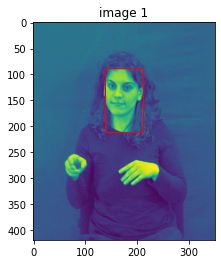

139 87


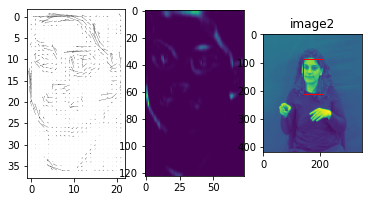

138 88


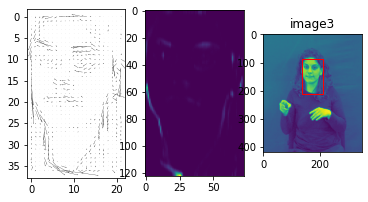

139 86


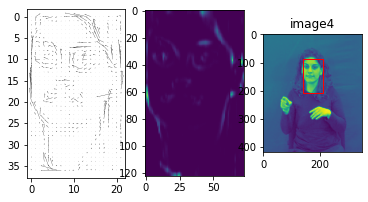

138 87


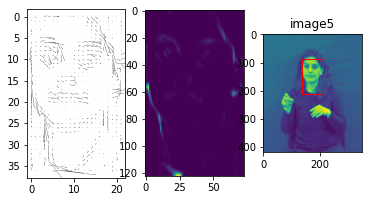

139 85


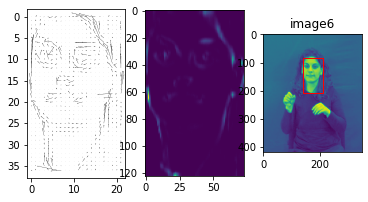

138 86


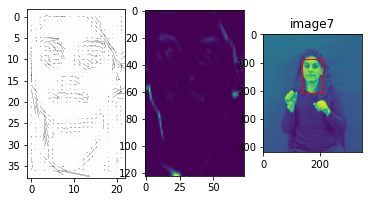

139 84


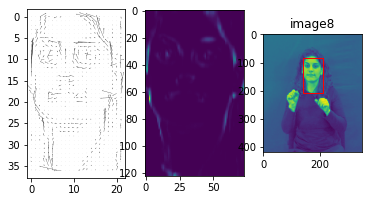

138 85


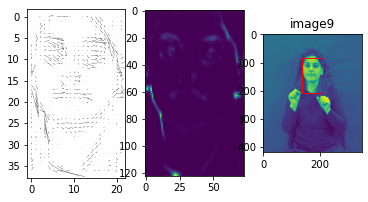

138 83


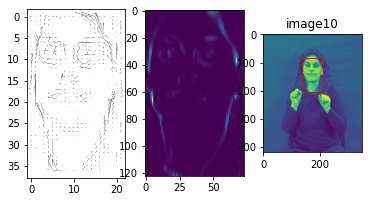

137 81


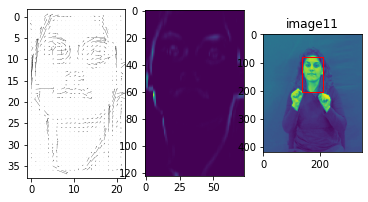

137 78


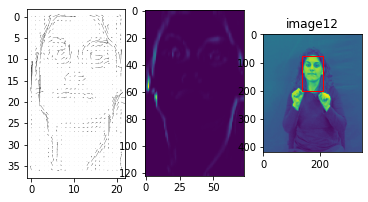

136 77


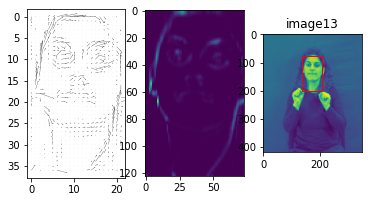

136 74


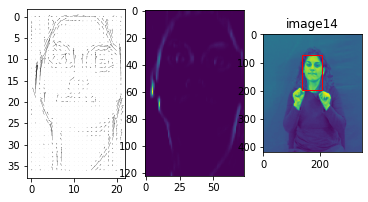

135 73


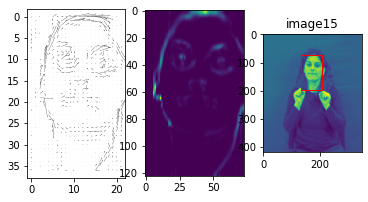

135 71


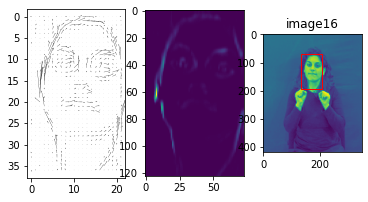

134 71


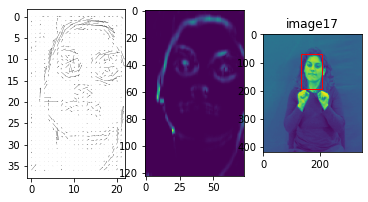

134 69


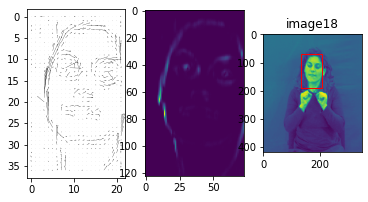

133 69


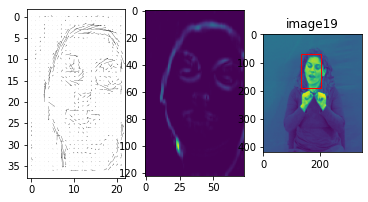

132 68


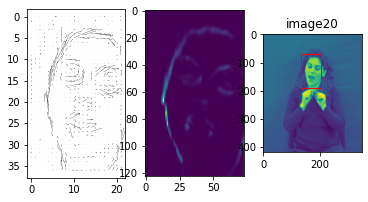

132 66


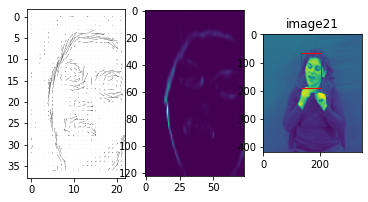

132 64


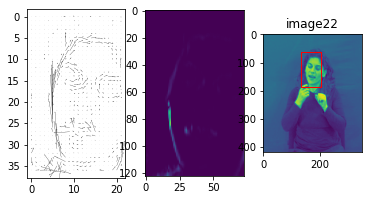

133 64


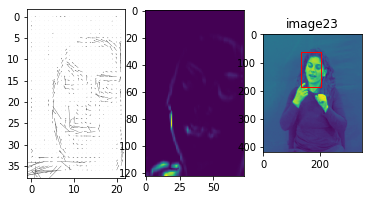

134 64


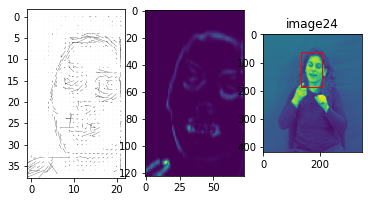

135 64


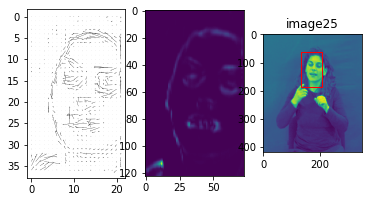

136 64


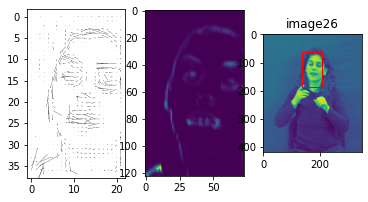

136 65


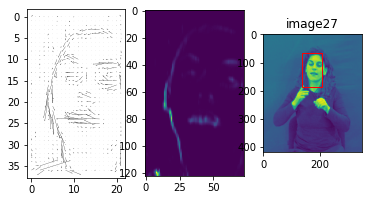

137 65


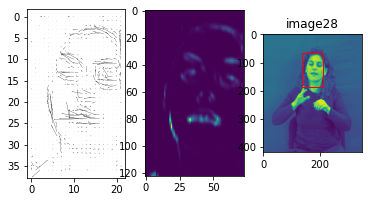

137 67


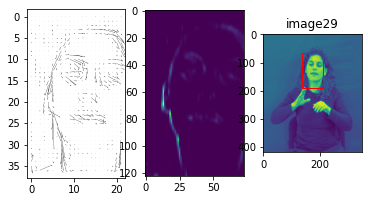

138 67


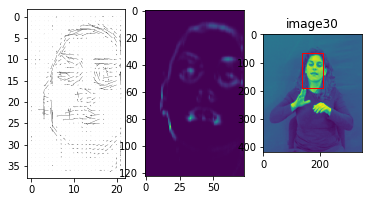

138 69


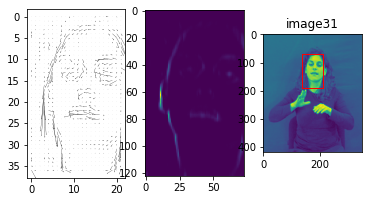

140 69


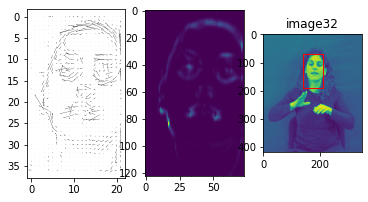

140 72


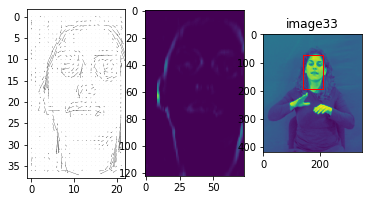

141 72


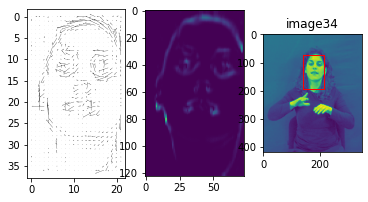

141 74


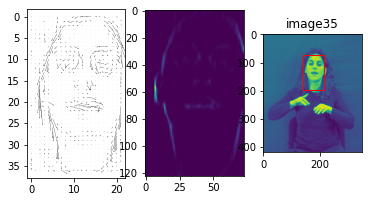

143 73


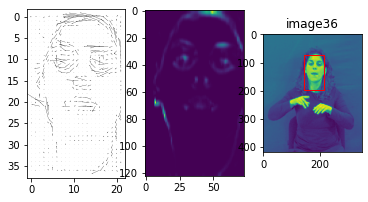

143 75


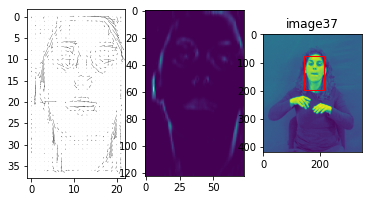

145 75


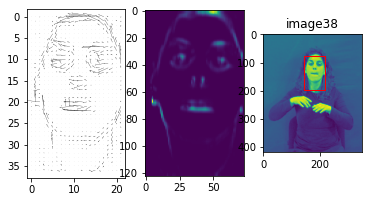

145 77


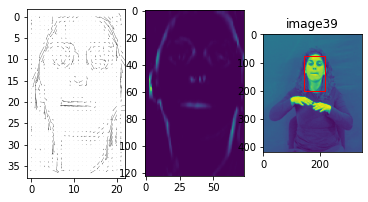

146 77


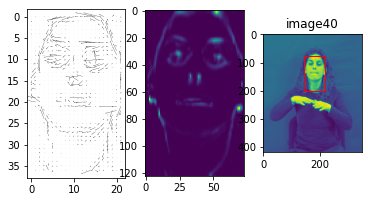

146 80


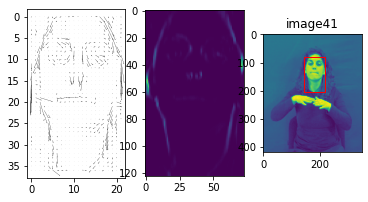

147 80


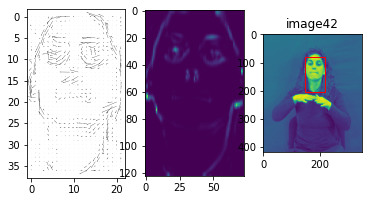

147 82


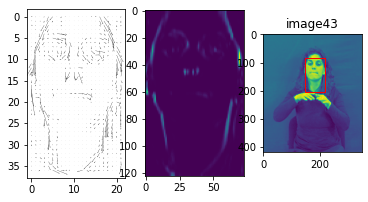

148 83


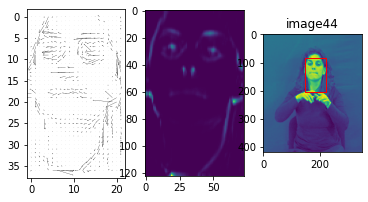

148 85


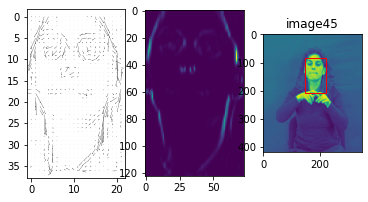

149 86


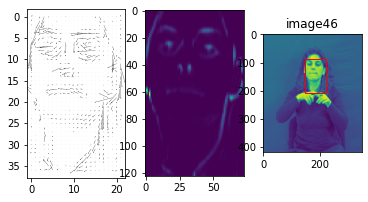

149 88


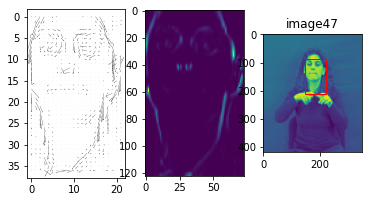

150 87


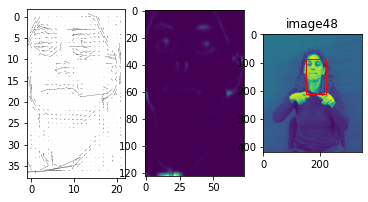

149 88


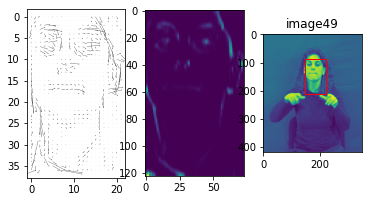

150 86


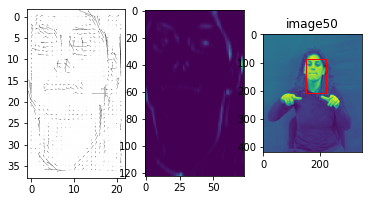

149 88


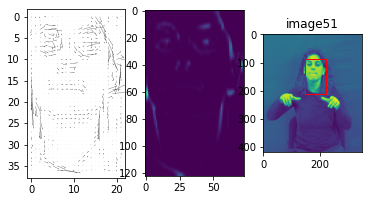

150 87


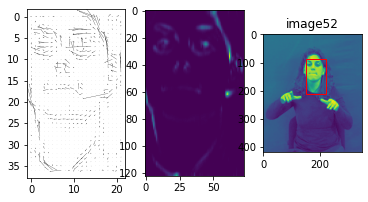

149 88


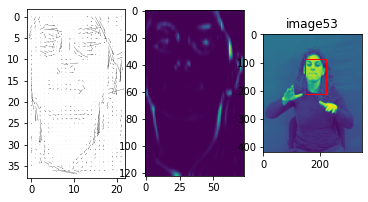

149 87


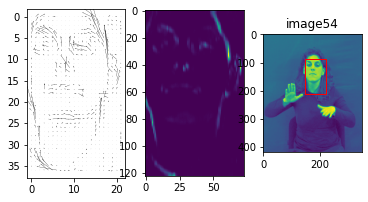

148 88


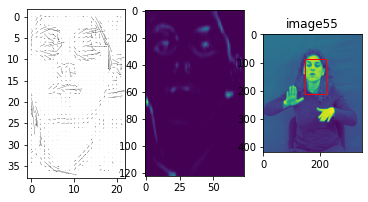

149 86


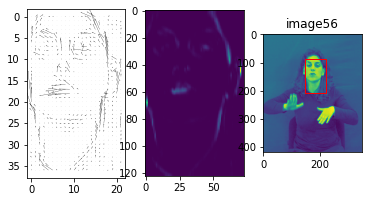

148 87


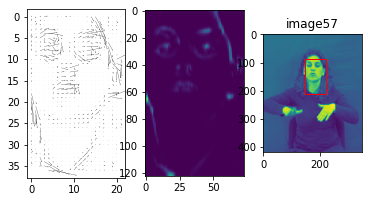

149 85


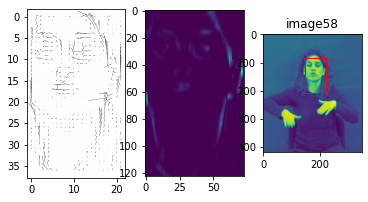

148 86


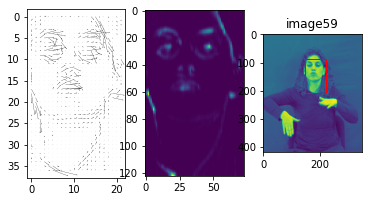

148 84


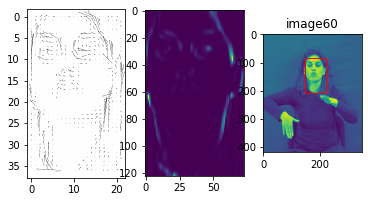

147 84


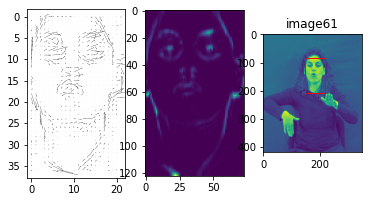

146 82


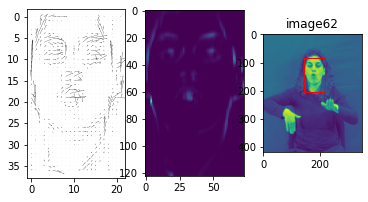

145 81


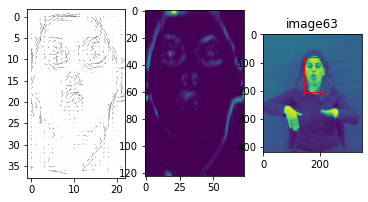

144 81


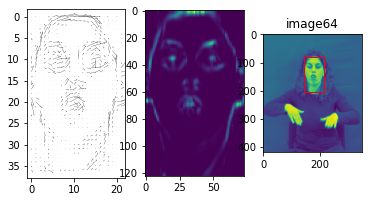

143 80


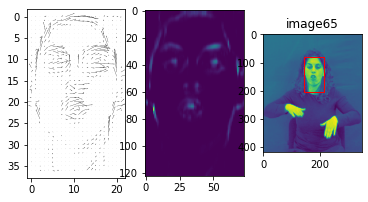

142 79


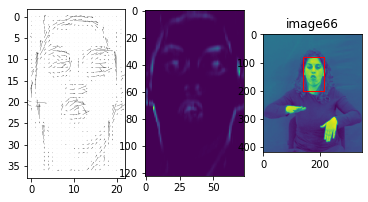

In [248]:
#psilodoyleuei thelei ki alles dokimes
a, b = display(face, 10, 0.1, 0.1)

47 243


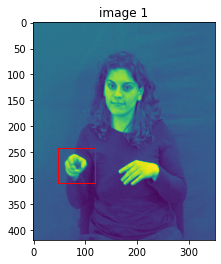

48 245


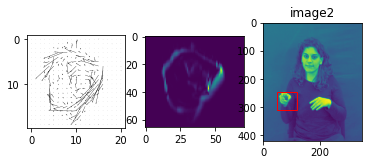

50 246


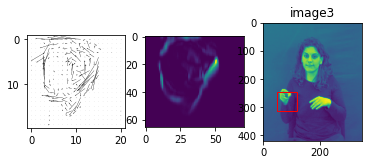

51 246


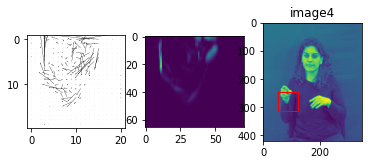

51 244


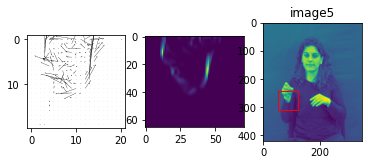

51 242


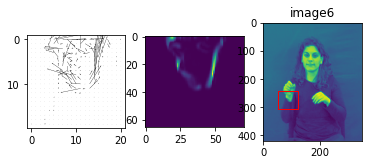

51 239


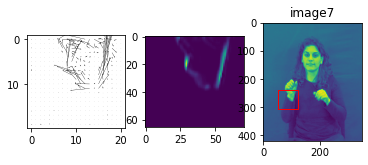

50 236


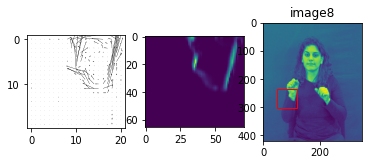

50 233


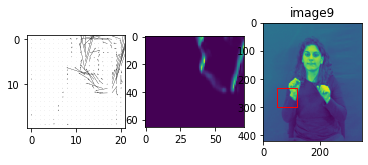

49 230


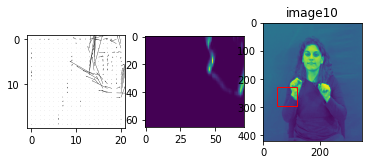

48 227


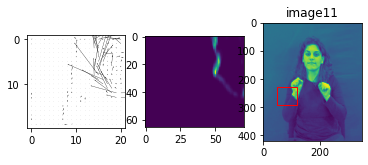

47 224


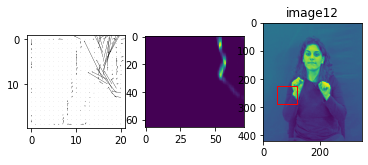

46 221


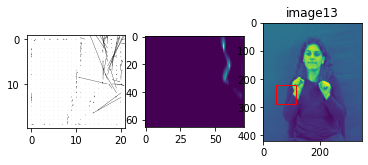

45 218


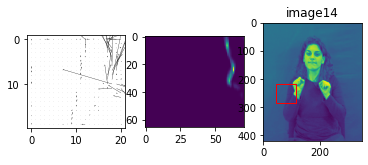

44 215


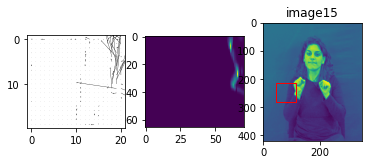

43 214


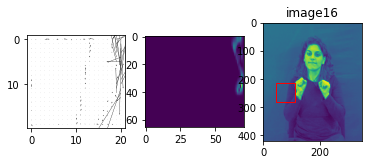

43 214


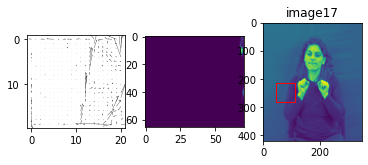

43 214


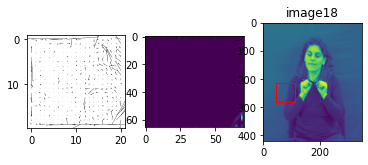

43 214


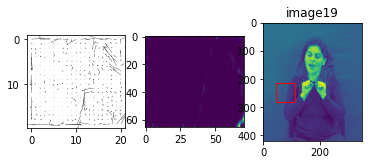

43 214


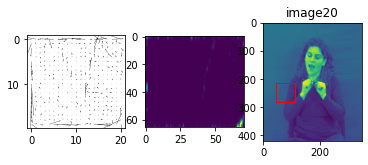

43 214


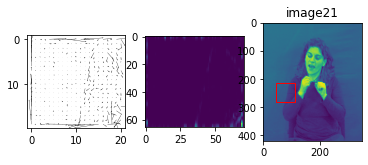

43 212


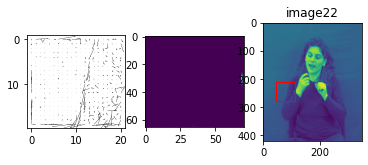

43 212


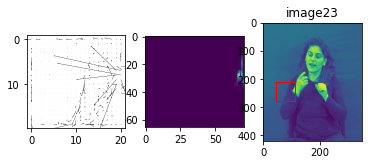

44 214


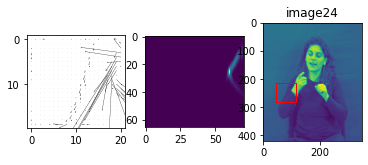

45 216


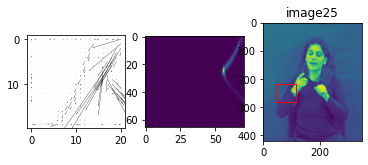

44 216


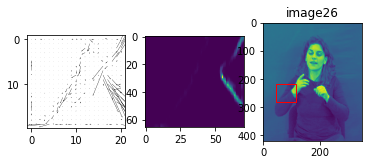

43 214


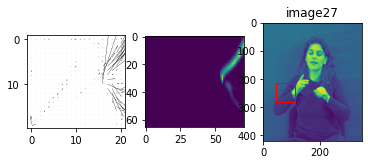

42 213


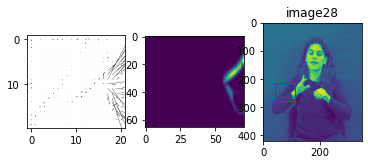

41 213


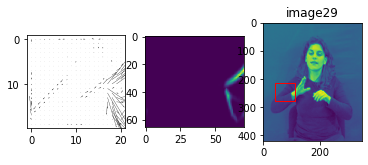

40 214


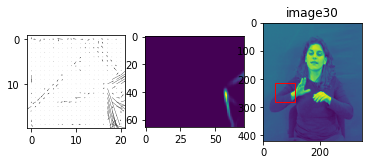

41 215


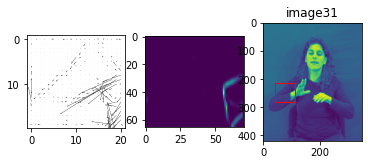

43 217


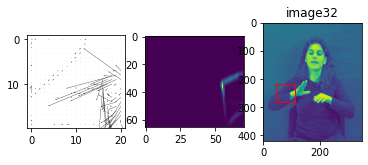

45 219


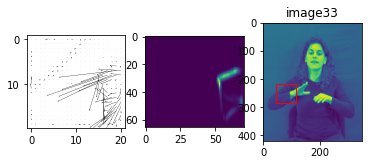

47 221


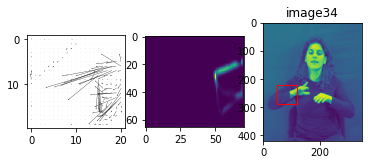

50 223


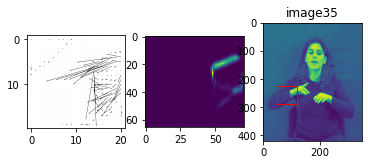

53 225


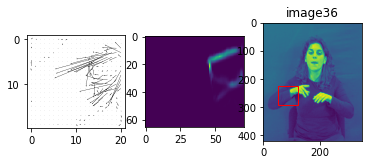

56 226


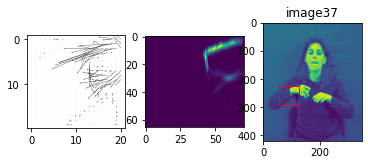

59 227


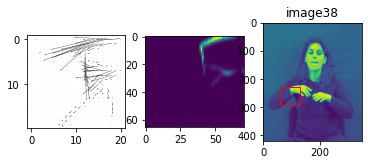

61 228


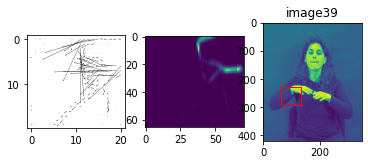

63 227


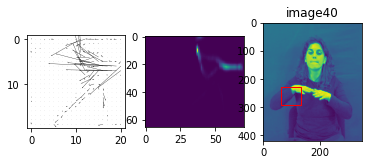

64 226


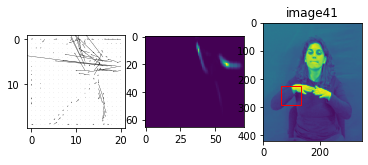

65 226


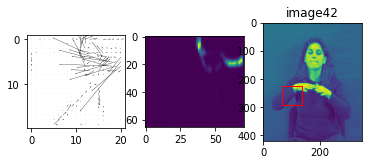

66 226


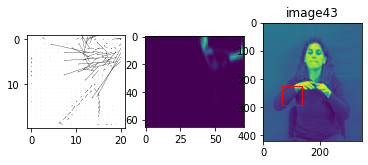

66 225


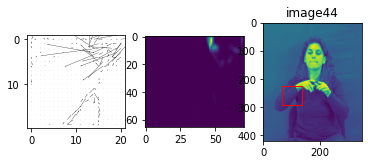

66 224


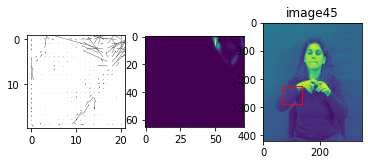

65 225


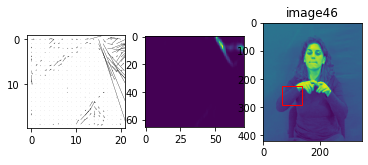

65 226


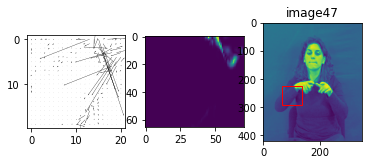

64 226


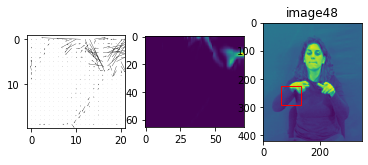

64 227


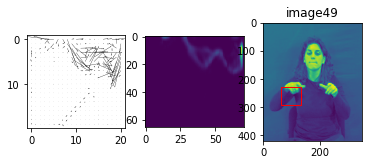

64 228


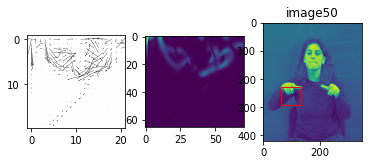

64 230


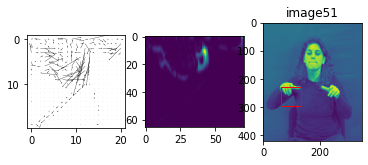

66 231


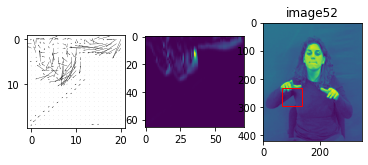

67 232


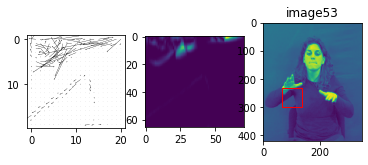

66 231


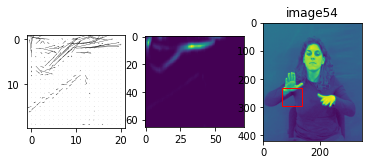

65 230


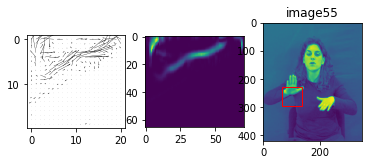

64 230


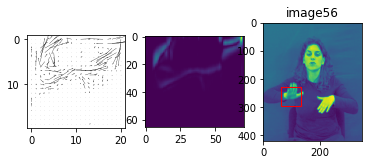

63 230


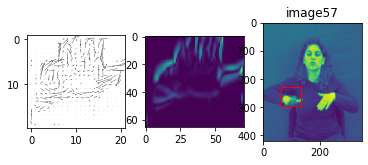

62 230


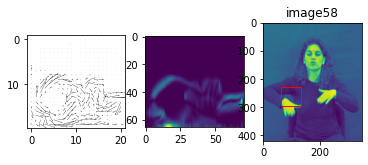

62 230


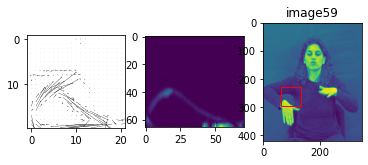

61 230


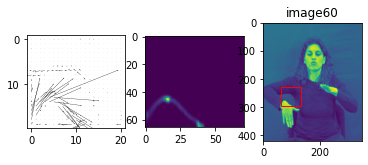

61 228


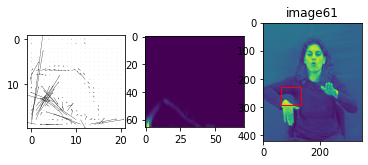

61 227


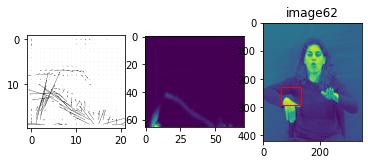

62 225


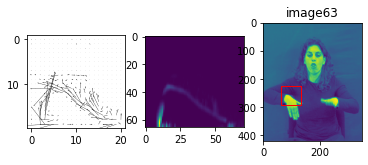

63 224


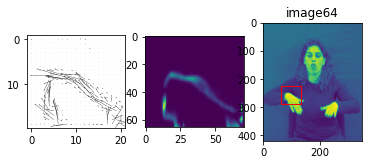

63 223


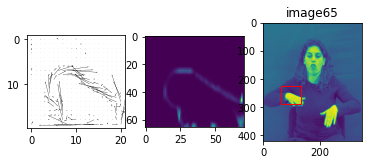

62 223


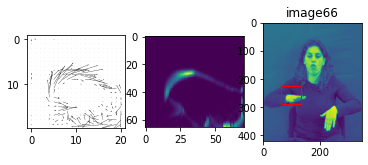

In [255]:
a, b = display(left_hand, 10, 0.1, 0.1)

162 264


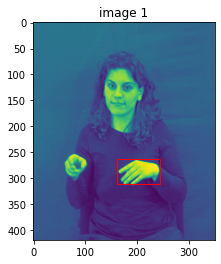

166 264


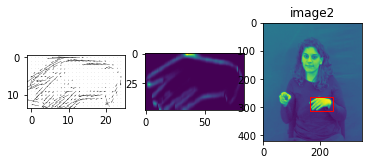

169 266


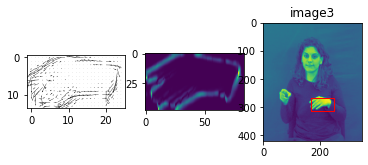

172 267


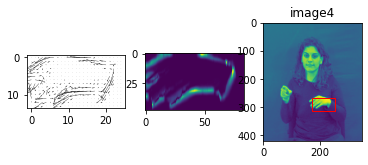

175 269


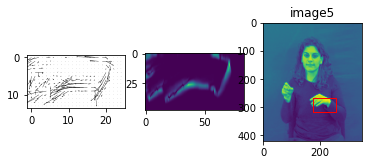

177 270


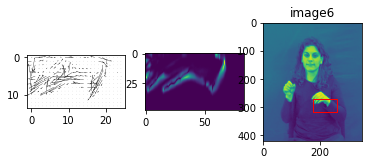

178 271


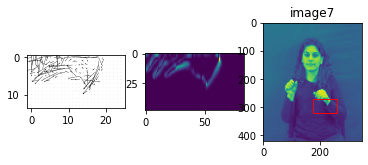

178 273


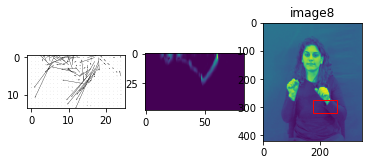

178 274


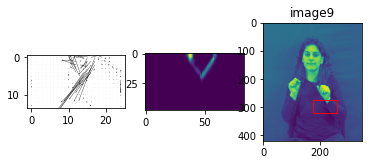

178 275


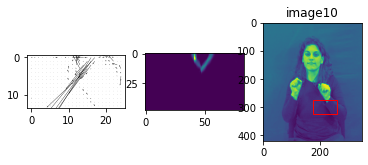

179 276


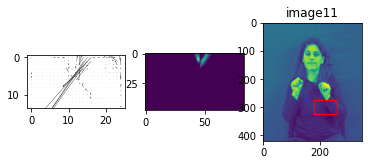

179 276


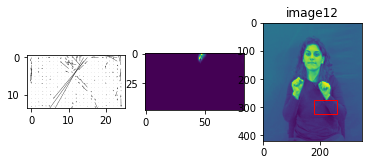

179 276


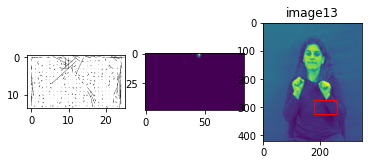

179 276


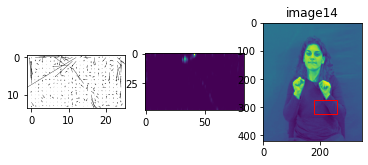

179 276


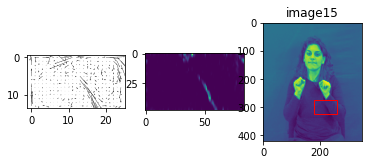

179 276


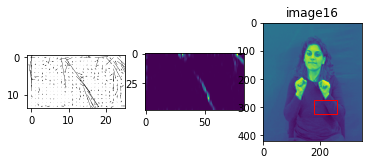

179 276


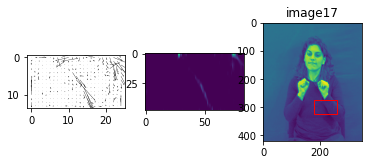

179 276


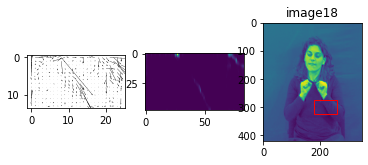

179 276


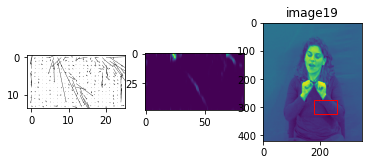

179 276


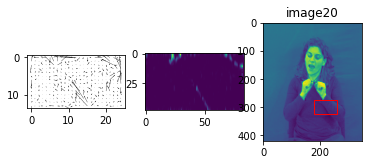

179 276


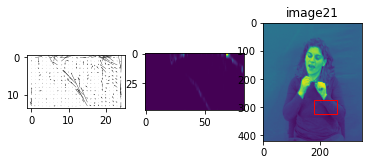

180 276


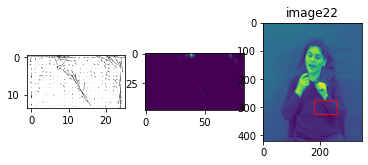

180 275


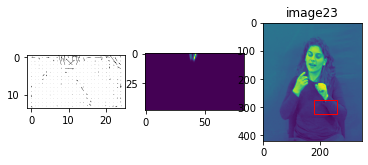

180 273


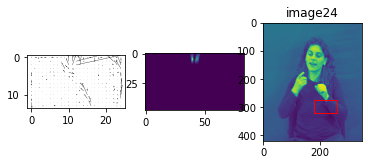

180 271


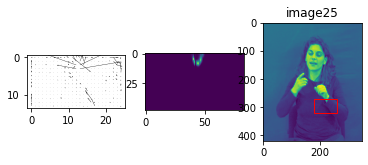

180 270


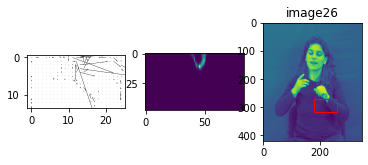

180 268


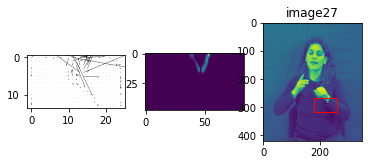

180 266


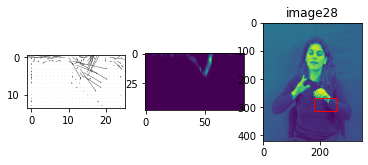

179 264


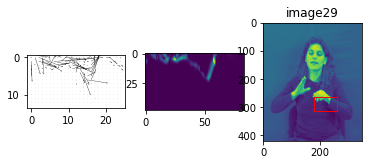

178 262


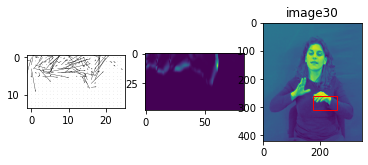

176 261


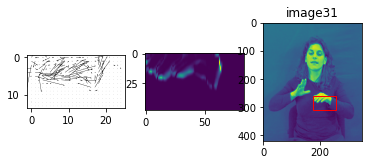

176 259


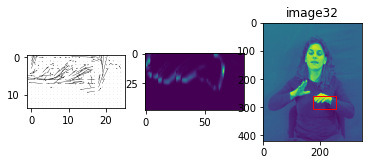

172 259


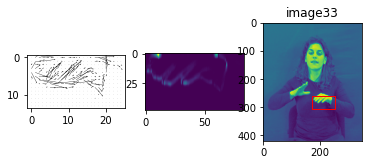

174 257


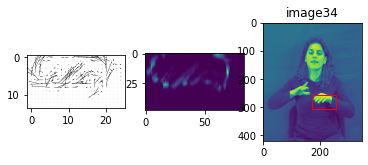

172 259


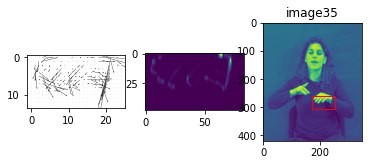

175 258


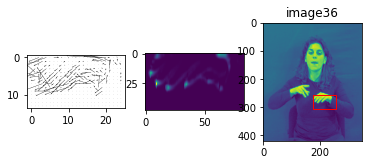

174 261


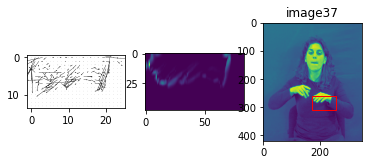

176 262


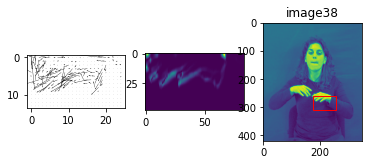

178 263


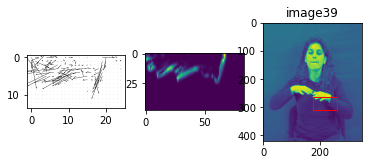

180 264


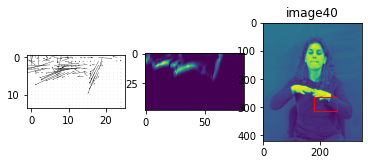

184 265


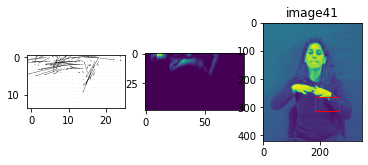

188 266


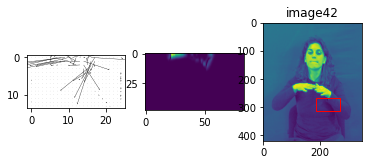

187 265


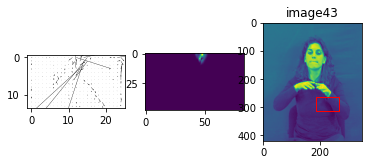

187 265


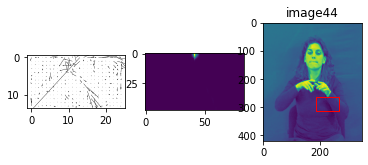

187 265


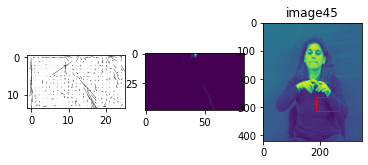

187 265


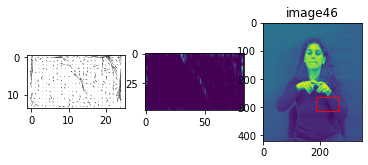

187 265


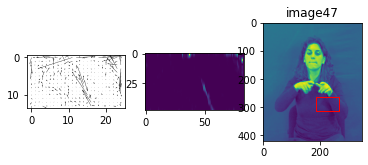

187 265


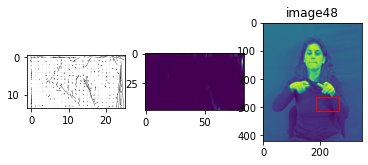

187 265


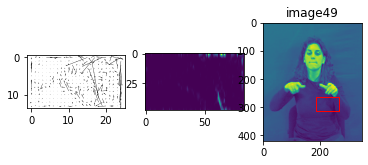

187 265


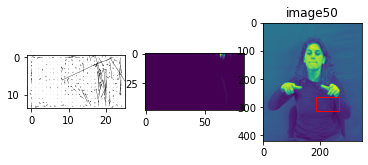

188 264


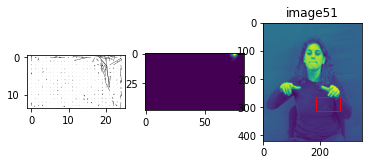

188 265


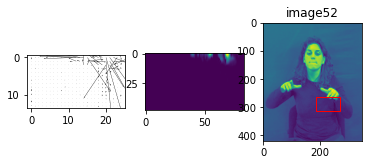

186 265


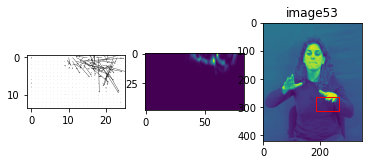

183 266


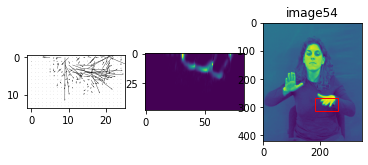

181 266


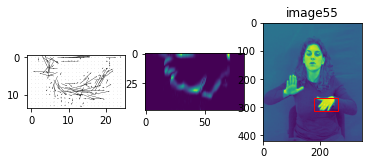

183 266


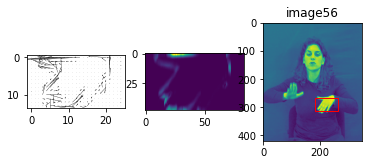

183 268


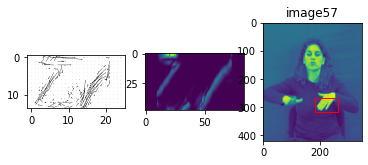

185 269


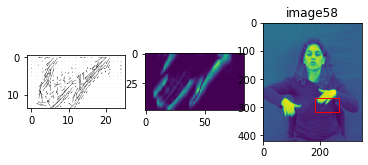

185 269


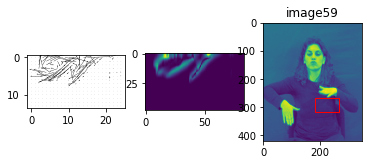

185 269


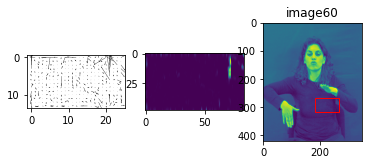

185 269


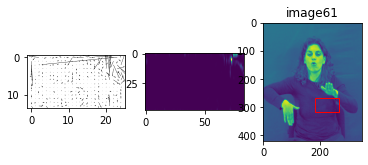

186 269


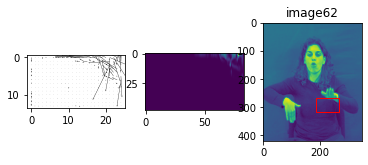

184 270


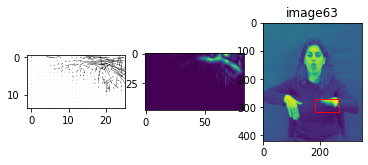

179 270


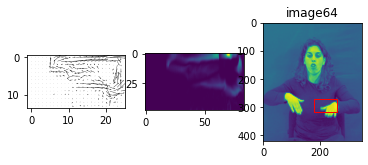

176 268


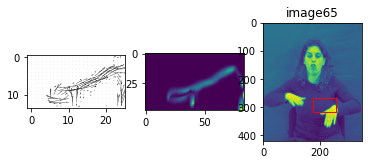

173 266


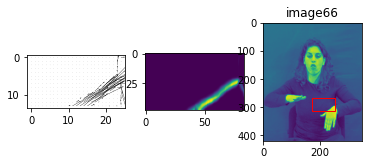

In [257]:
a, b = display(right_hand, 10, 0.1, 0.3)

# 1.2.3

Η παρακάτω συνάρτηση pyramid με τη βοήθεια της συνάρτησης pyrdown, υποδιπλασιάζει την ανάλυση της εικόνας κατά 2 δημιουργώντας τη ζητούμενη ακολουθία εικόνων. Ύστερα εφαρμόζουμε κατά σειρά από την μικρότερη εικόνα στην μεγαλύτερη τον μετασχηματισμό Lucas-Kanade δίνοντας ως input στη μεγαλύτερη εικόνα την μετατόπιση που προέκυψε από την μικρότερη. Όπως λέει η εκφώνηση πολλαπλασιάζουμε επί 2 τις συντεταγμένες που βρήκαμε ώστε να γίνουν fit στο κατάλληλο σημείο της μεγαλύτερης εικόνας.

In [291]:
def displ(dx, dy, thres, ax2):
    #print(np.mean(dx), np.mean(dy))
    E = dx**2 + dy**2
    ax2.imshow(E)
    #plt.show()
    t = thres*np.max(E)
    #print(t)
    #print(E.max())
    a = np.sum(np.where(E > t, 1, 0))
    ma = np.sum(np.where(E > t, dx, 0)) / a
    mb = np.sum(np.where(E > t, dy, 0)) / a
    #print(ma, mb)
    return int(np.round(ma)), int(np.round(mb))


def pyramid(start, I1, I2, scales, rho, epsilon, thresh_percent, ax1, ax2):
    
    startx = start[0]
    starty = start[1]
    width = start[2]
    height = start[3]
    
    layer1=I1
    layer2=I2
    imgs1 = []
    imgs2 = []
    imgs1.append(layer1)
    imgs2.append(layer2)
    '''
    plt.imshow(layer1)
        
    rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
    plt.gca().add_patch(rect)
    plt.show()
    '''
    for i in range(scales-1): 
        layer1 = cv2.pyrDown(layer1) 
        layer2 = cv2.pyrDown(layer2)
        startx//=2
        starty//=2
        width//=2
        height//=2
        '''
        plt.imshow(layer1)
        
        rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
    
        #print(startx, starty)
        # Add the patch to the Axes
        plt.gca().add_patch(rect)
        
        plt.show()
        '''
        imgs1.append(layer1)
        imgs2.append(layer2)

        
    for i in range(scales-1, -1, -1):
        '''
        print("scale {}".format(i))
        print(i)
        print(imgs1[i])
        '''
        I1 = imgs1[i][starty:starty+height, startx:startx+width]
        I2 = imgs2[i][starty:starty+height, startx:startx+width]
        
        dx, dy = find_d(I1, I2, rho, epsilon, ax1)
        movex, movey = displ(dx, dy, thresh_percent, ax2)
        startx, starty = step(startx+movex), step(starty+movey)
        
        '''
        plt.imshow(imgs2[i])
        rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
        plt.gca().add_patch(rect)
        plt.show()
        '''
        startx*=2
        starty*=2
        width*=2
        height*=2

    return startx//2, starty//2

def multi_display(start, scales, rho, epsilon, thresh_percent):
    startx = start[0]
    starty = start[1]
    width = start[2]
    height = start[3]
    
    I = cv2.imread('GreekSignLanguage/1.png', cv2.IMREAD_GRAYSCALE)
    
    I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
    I1 = I
    plt.imshow(I)
    
    rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')
    
    #print(startx, starty)
    # Add the patch to the Axes
    plt.gca().add_patch(rect)
    plt.title("image 1")
    plt.show()
    
    for i in range(2, total+1):
    
        f, (ax1, ax2, ax3) = plt.subplots(1, 3)
        
        I = cv2.imread('./GreekSignLanguage/'+str(i)+'.png', cv2.IMREAD_GRAYSCALE)
        I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        
        I2 = I

        startx, starty = pyramid(start, I1, I2, scales, rho, epsilon, thresh_percent, ax1, ax2)
        
        #startx, starty = movex, movey
        print(startx,starty)
        ax3.imshow(I)

        rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')

        # Add the patch to the Axes
        plt.gca().add_patch(rect)
        ax3.title.set_text('image' + str(i))
        plt.show()
        
        I1 = I2

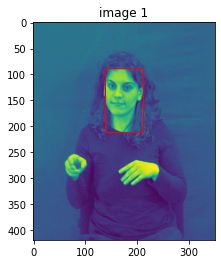

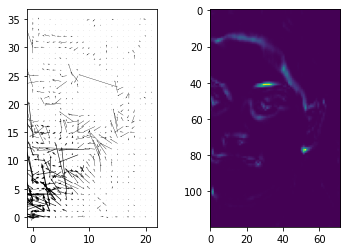

In [292]:
scales=4
rho=4
epsilon=0.1
start=face
thresh_percent=0.1
startx = start[0]
starty = start[1]
width = start[2]
height = start[3]

I = cv2.imread('GreekSignLanguage/1.png', cv2.IMREAD_GRAYSCALE)
    
I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
I1 = I
plt.imshow(I)
    
rect = patches.Rectangle((startx,starty),width,height,linewidth=1,edgecolor='r',facecolor='none')

#print(startx, starty)
# Add the patch to the Axes
plt.gca().add_patch(rect)
plt.title("image 1")
plt.show()

I = cv2.imread('./GreekSignLanguage/'+'2.png', cv2.IMREAD_GRAYSCALE)
I = cv2.normalize(I, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

I2 = I

f, (ax1, ax2) = plt.subplots(1,2)
startx, starty = pyramid(start, I1, I2, scales, rho, epsilon, thresh_percent, ax1, ax2)

Ομοίως με πριν ορίζουμε την συνάρτηση multi_display στην οποία εφαρμόζουμε πολυκλιμακωτή ανίχνευση για όλη την αλληλουχία εικόνων. Παρακάτω βλέπουμε τα αποτελέσματα για πρόσωπο, αριστερό και δεξύ χέρι αντίστοιχα. 

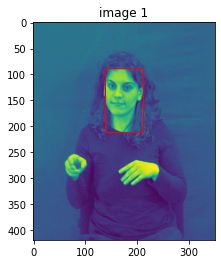

151 73


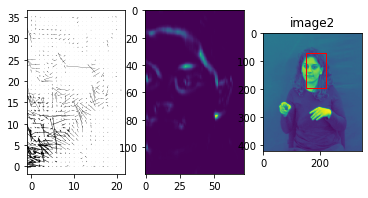

151 74


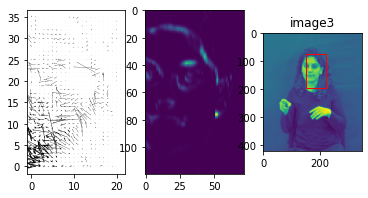

151 74


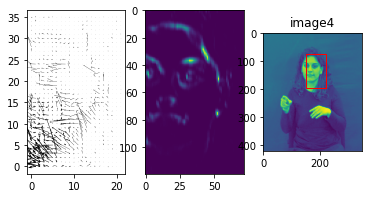

151 74


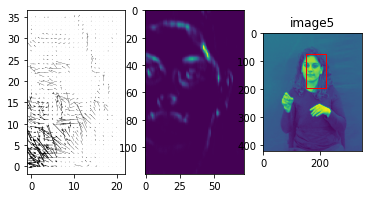

151 73


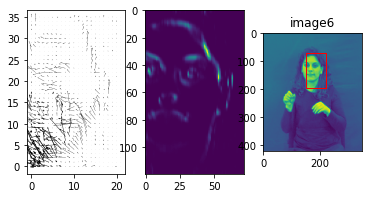

143 73


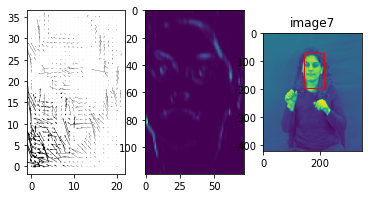

143 73


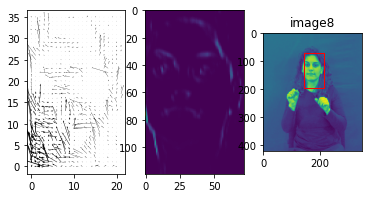

143 72


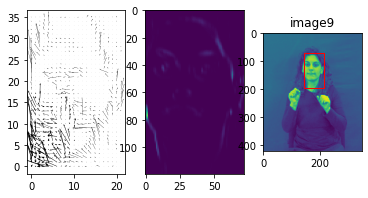

142 72


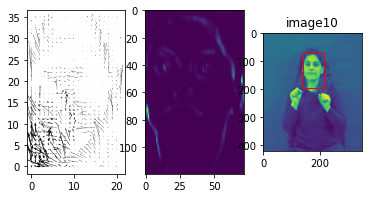

142 72


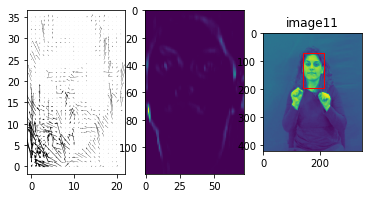

142 72


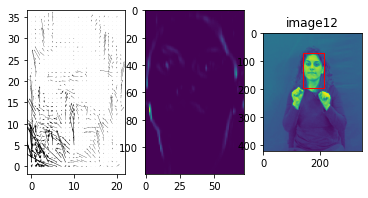

142 72


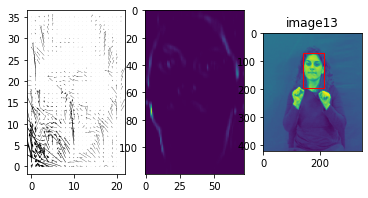

142 72


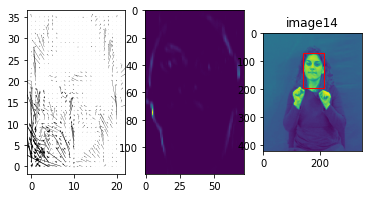

140 72


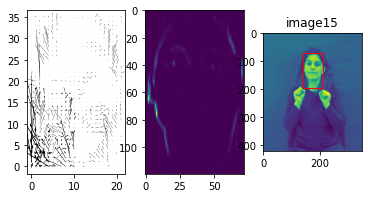

140 80


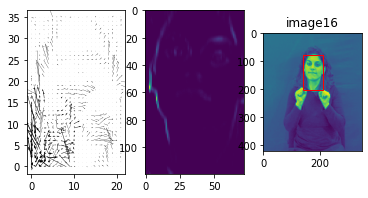

136 80


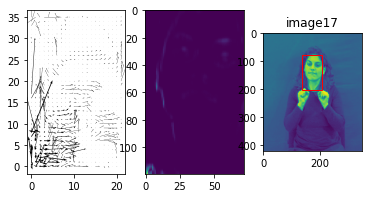

133 85


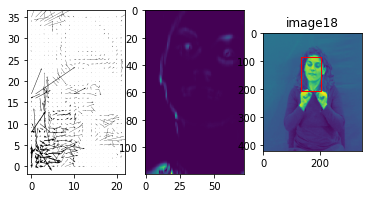

132 91


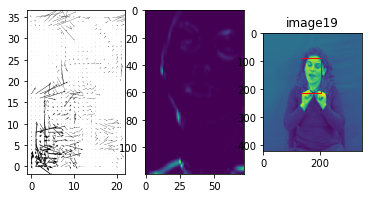

136 101


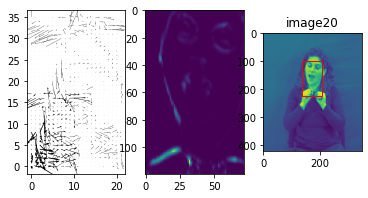

138 103


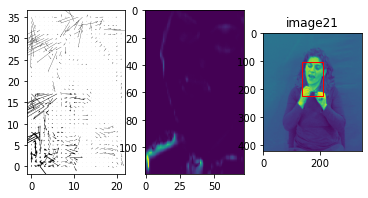

148 80


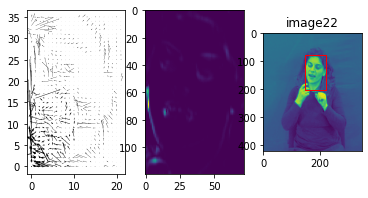

145 82


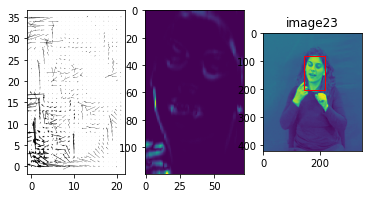

143 73


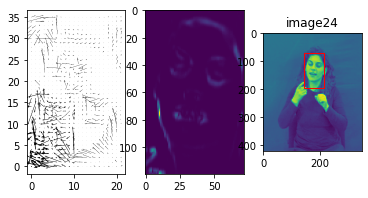

143 73


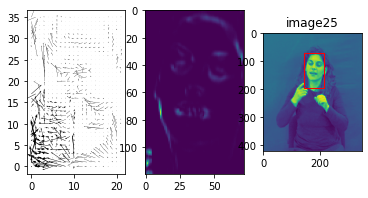

138 73


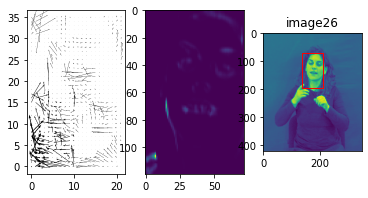

136 81


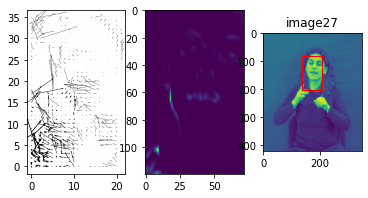

135 77


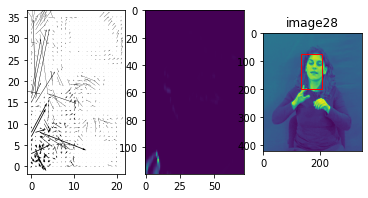

136 87


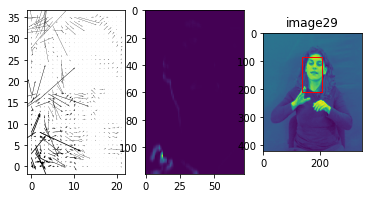

133 89


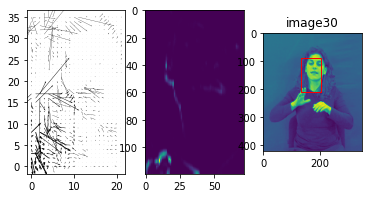

135 82


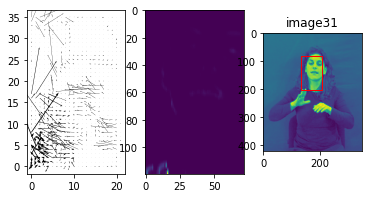

137 86


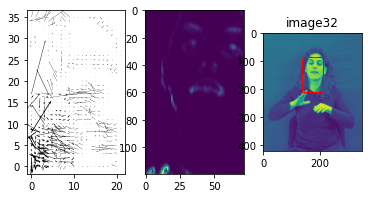

139 84


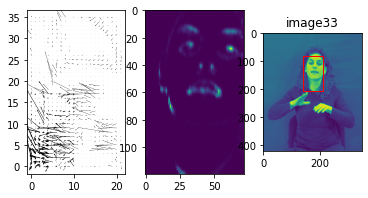

143 88


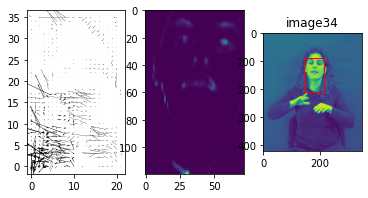

136 88


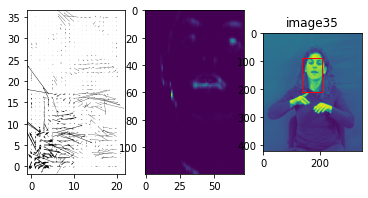

133 88


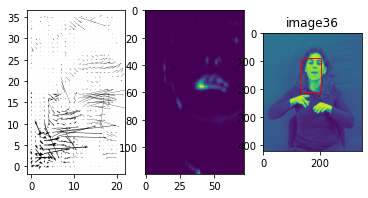

136 88


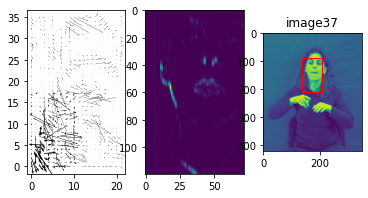

136 92


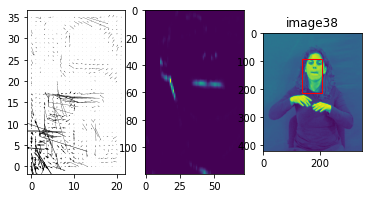

137 92


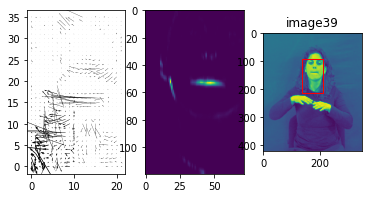

137 92


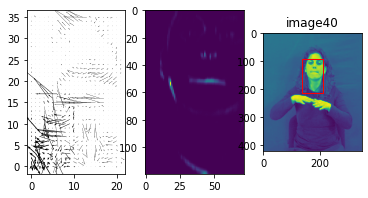

136 95


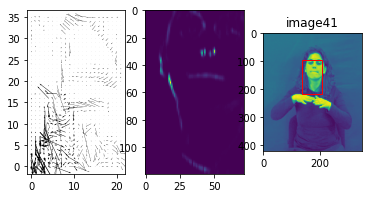

136 95


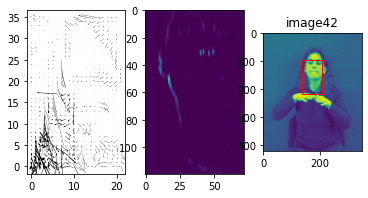

132 95


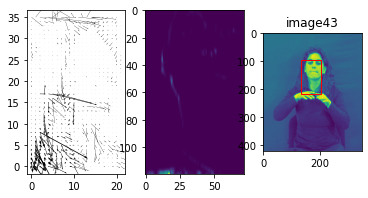

143 96


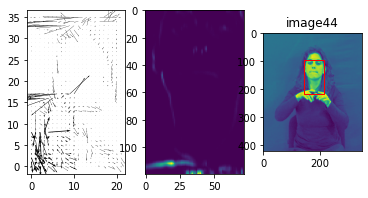

133 96


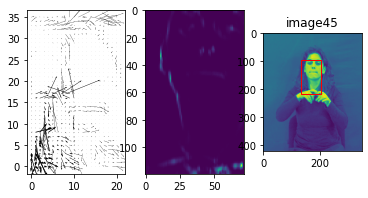

132 96


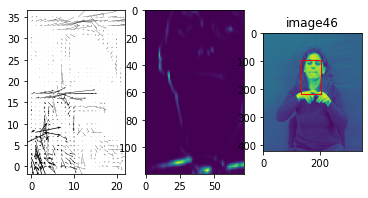

133 100


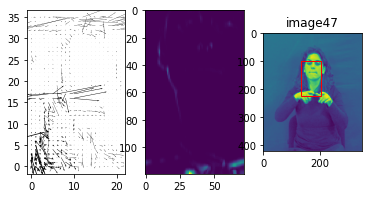

131 92


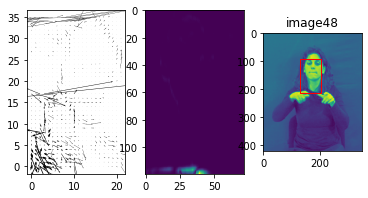

136 88


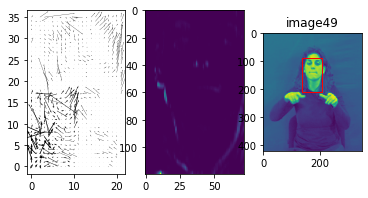

136 88


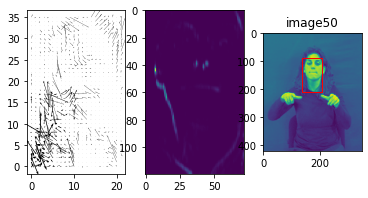

135 91


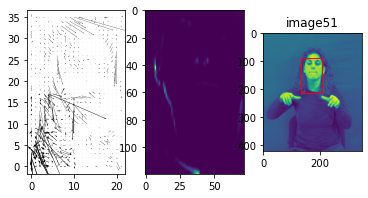

136 95


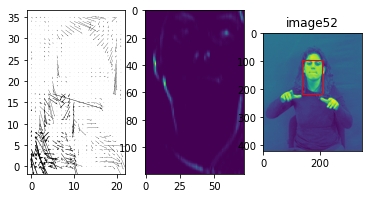

135 103


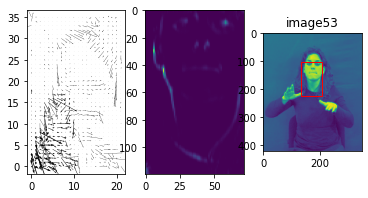

129 102


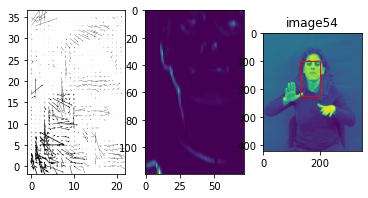

133 95


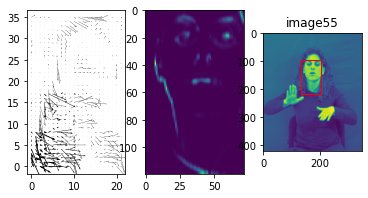

130 92


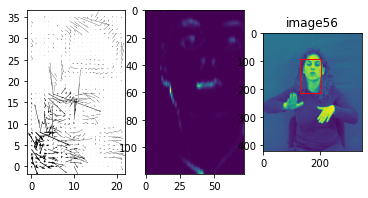

136 70


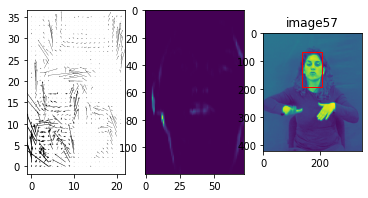

138 72


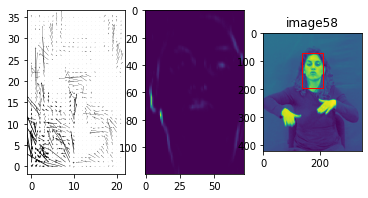

138 72


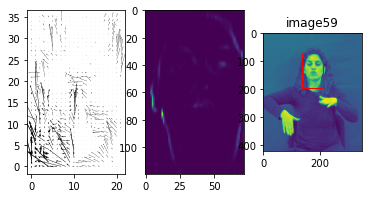

136 72


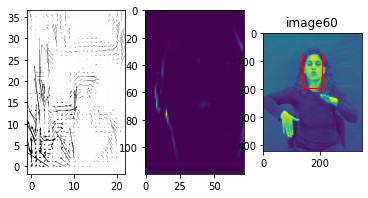

136 87


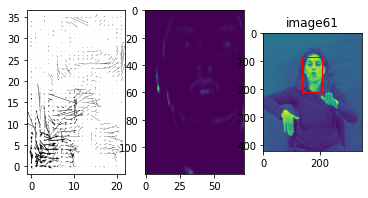

129 100


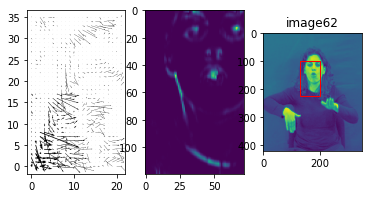

133 94


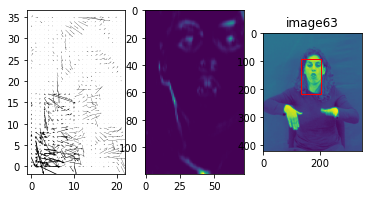

121 103


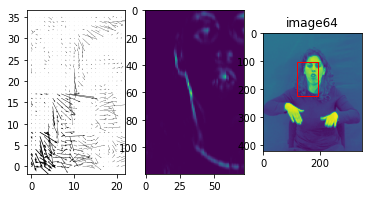

121 103


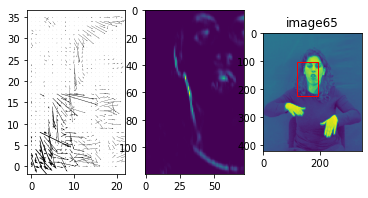

131 92


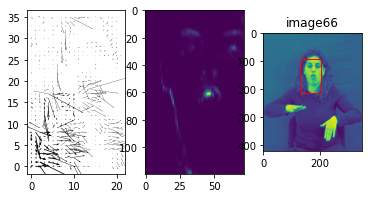

In [293]:
#keep it
#para tis metatopiseis twn xeriwn katafernei kai paramenei sto proswpo

multi_display(face, 4, 10, 0.1, 0.1)

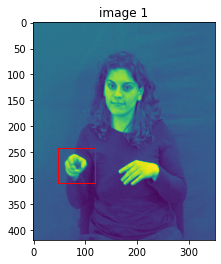

60 249


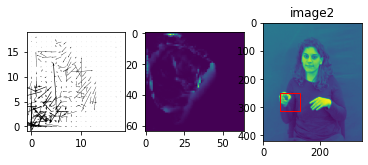

74 228


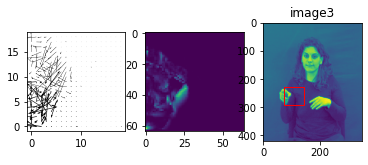

75 225


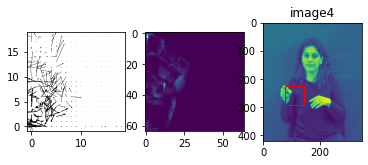

57 214


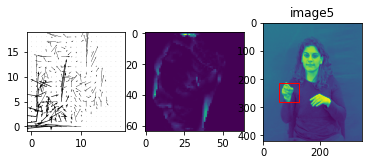

46 218


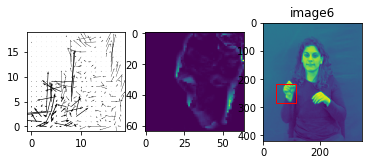

39 236


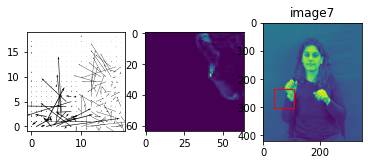

21 237


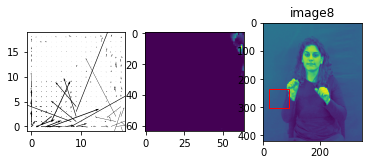

49 253


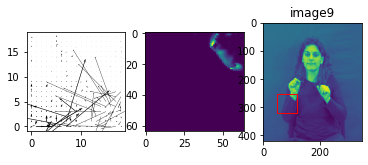

35 236


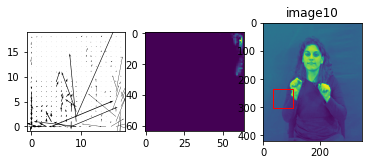

40 236


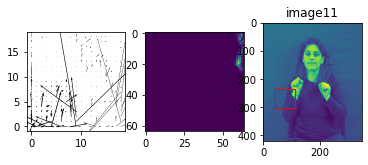

38 237


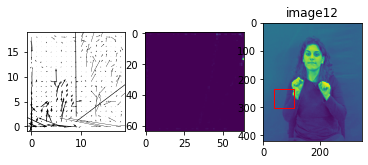

40 240


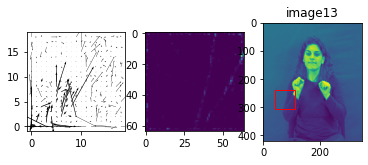

40 240


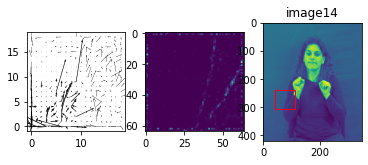

40 240


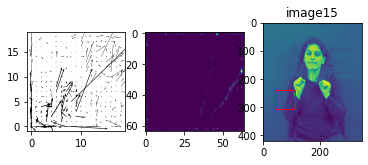

40 241


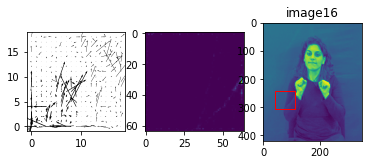

40 241


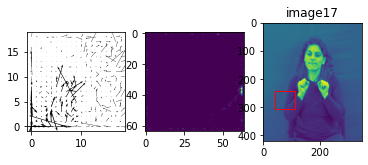

40 242


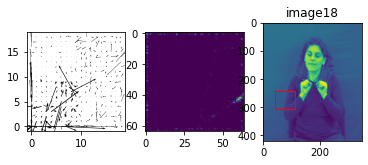

40 240


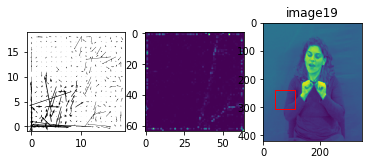

40 240


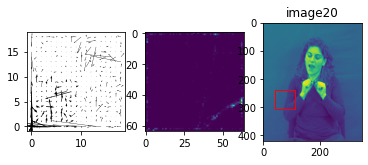

40 240


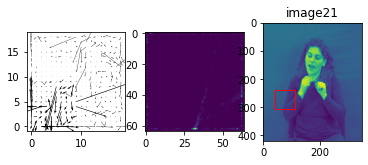

40 240


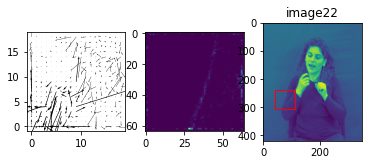

43 239


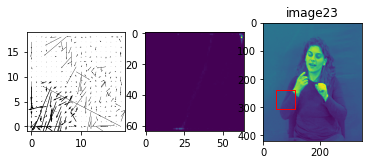

42 242


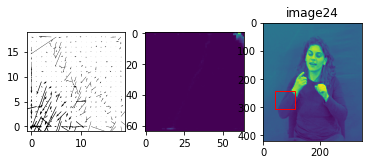

40 245


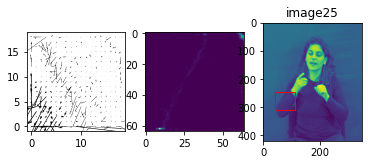

38 240


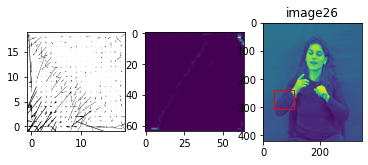

37 239


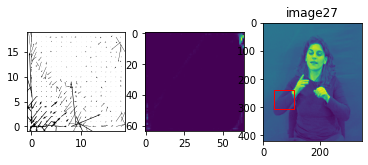

37 240


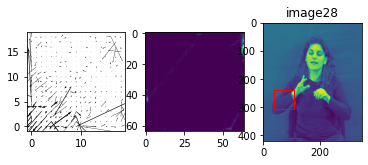

36 245


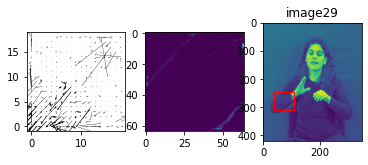

35 250


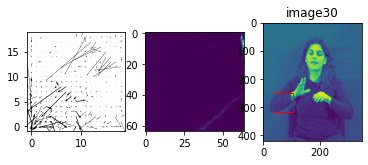

35 257


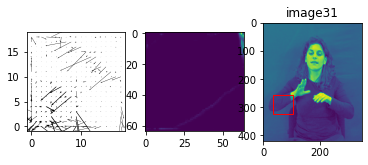

40 255


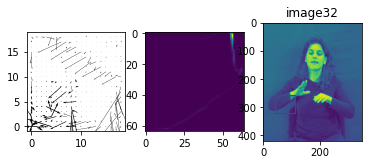

43 241


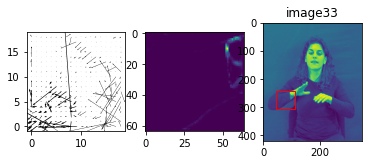

44 238


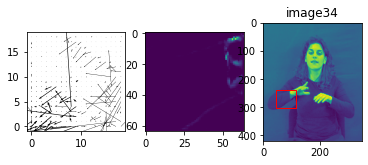

51 233


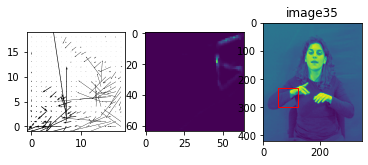

45 233


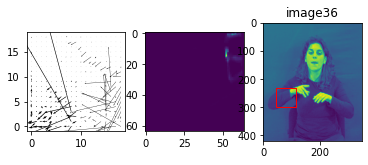

32 242


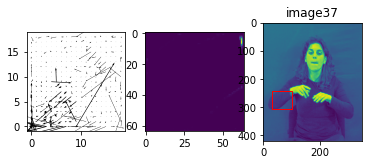

42 243


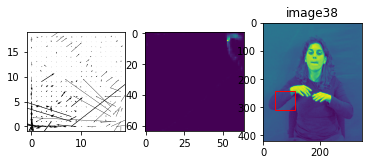

44 247


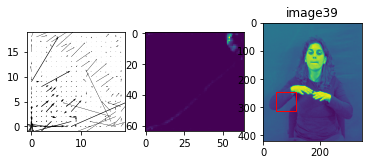

40 245


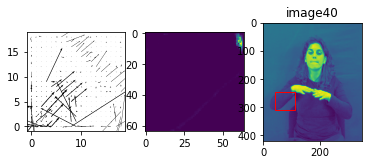

40 246


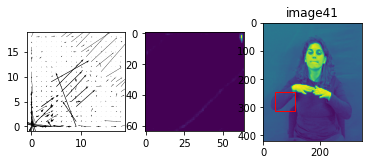

39 239


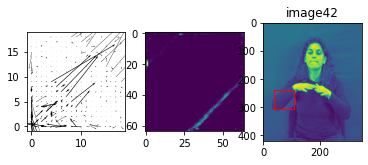

40 240


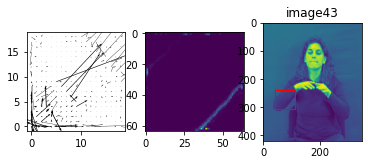

40 240


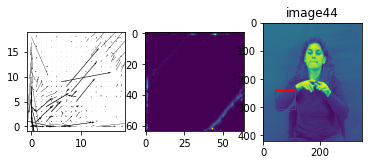

40 240


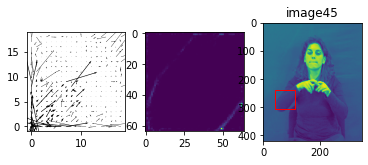

40 240


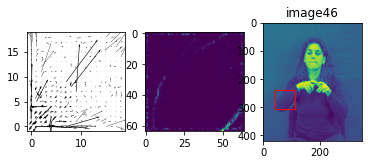

40 240


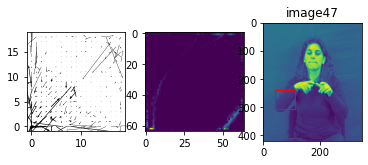

40 239


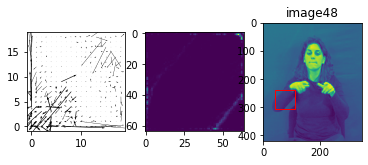

34 240


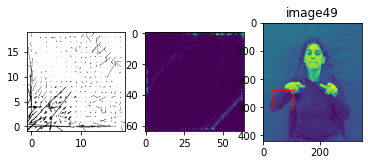

16 240


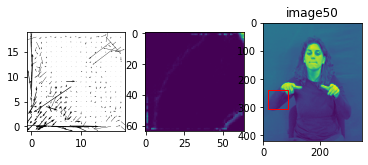

0 244


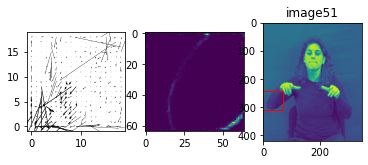

58 256


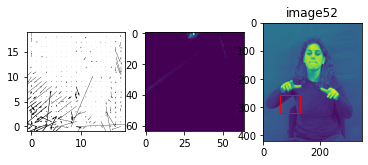

47 248


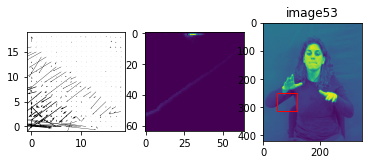

38 233


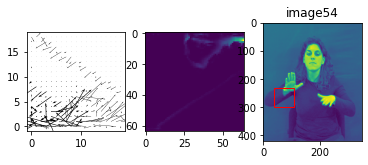

15 252


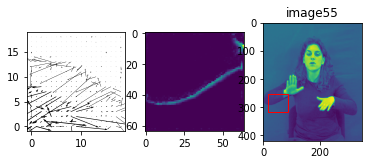

11 255


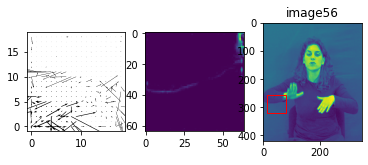

9 247


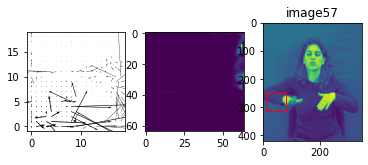

1 244


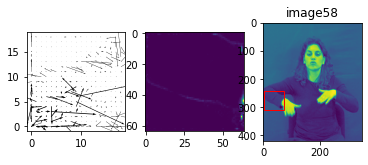

0 239


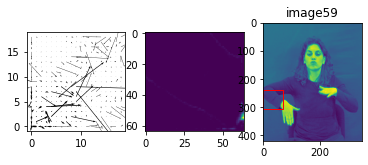

25 259


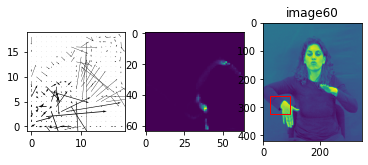

47 200


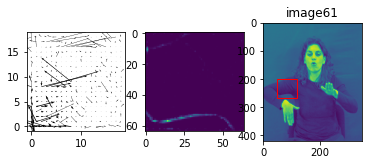

44 214


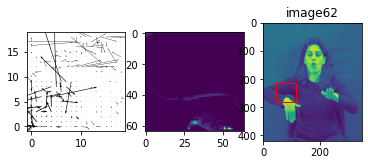

63 204


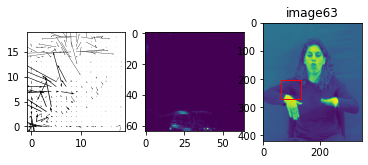

57 207


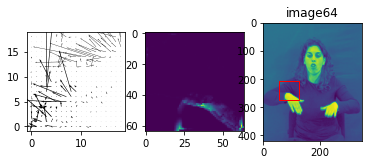

59 224


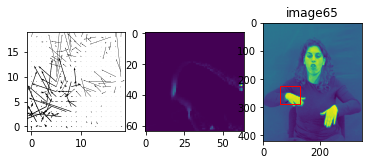

12 244


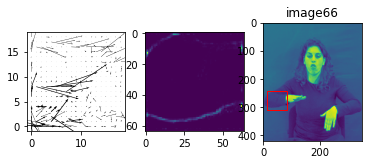

In [270]:
multi_display(left_hand, 4, 3, 0.05, 0.2)

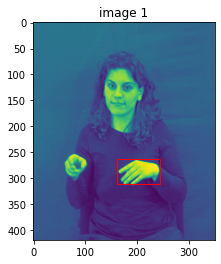

189 258


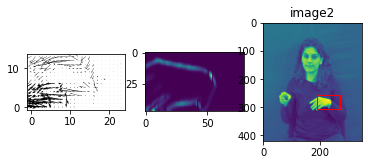

189 258


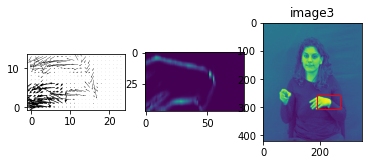

189 252


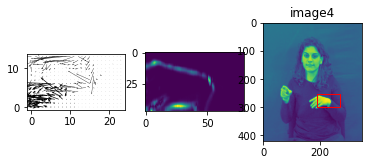

211 257


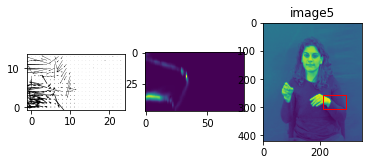

206 256


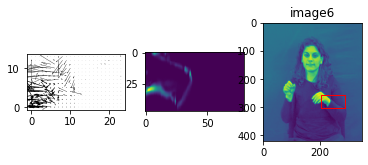

195 259


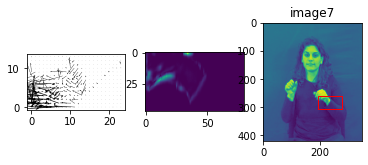

138 246


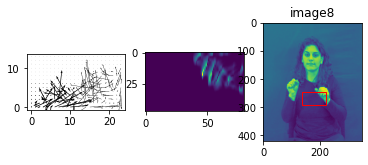

151 253


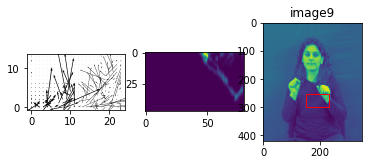

153 253


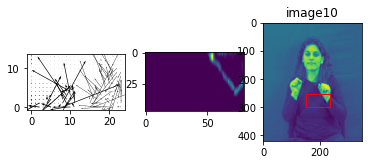

153 249


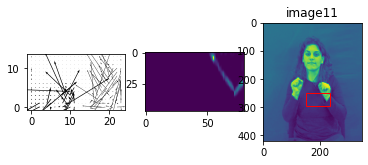

155 247


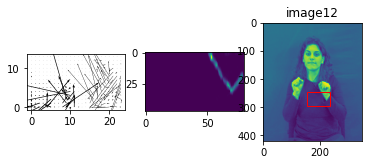

163 248


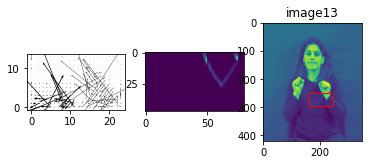

159 254


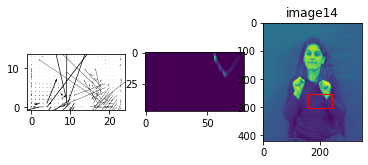

157 273


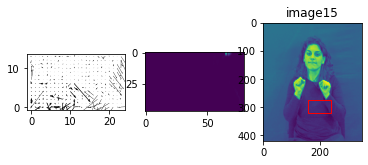

161 273


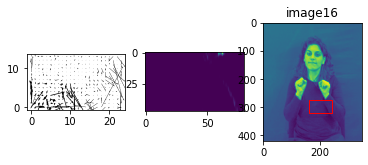

153 273


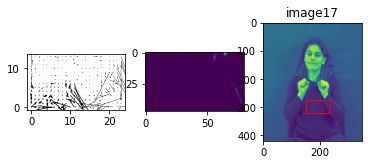

153 273


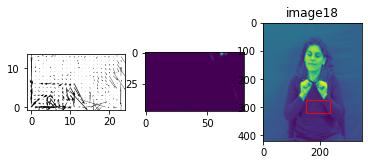

160 276


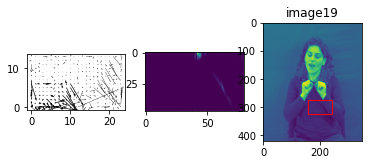

148 271


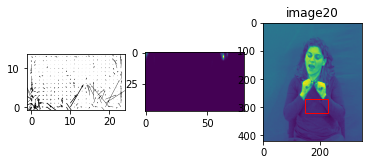

155 252


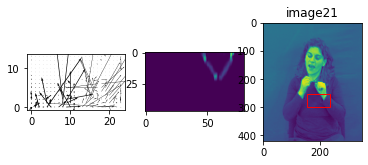

159 254


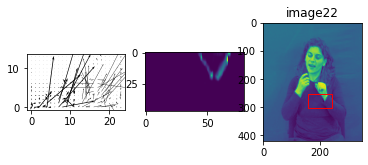

165 254


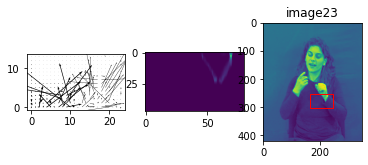

156 246


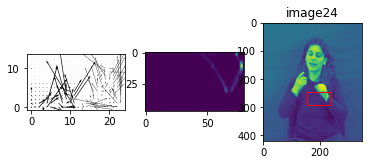

160 252


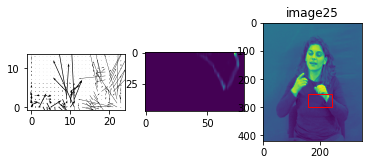

163 256


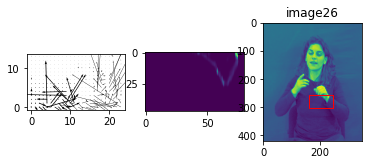

149 266


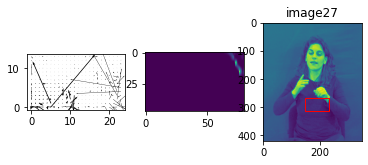

145 275


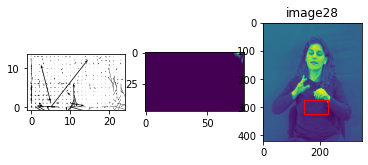

140 273


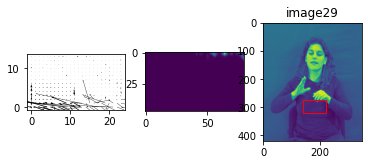

130 270


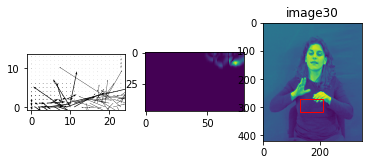

144 288


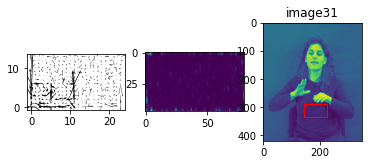

146 271


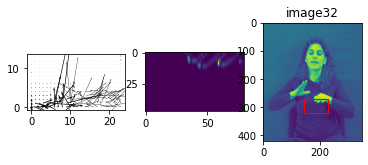

160 246


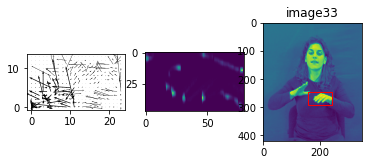

168 256


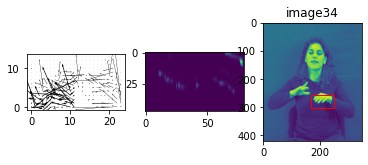

167 264


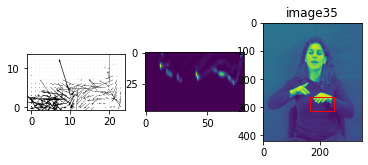

148 284


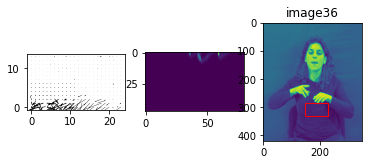

153 281


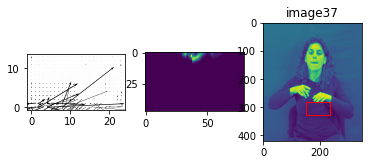

179 257


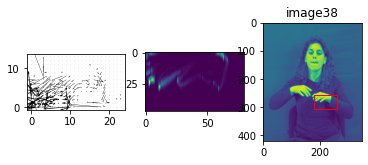

173 251


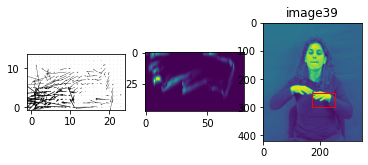

170 258


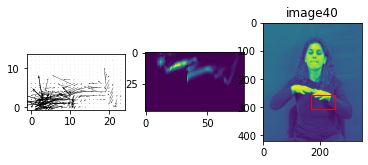

175 264


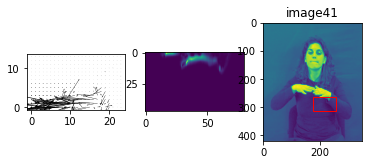

171 265


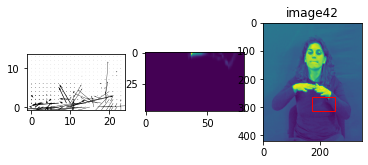

168 272


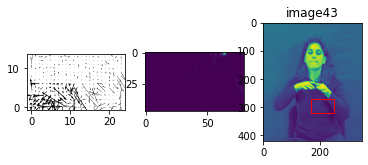

161 265


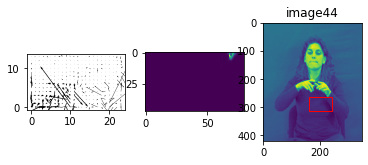

161 264


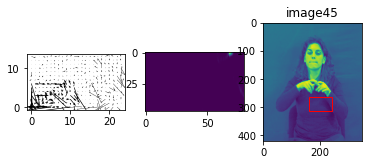

160 264


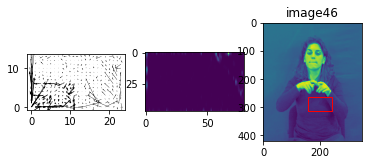

160 264


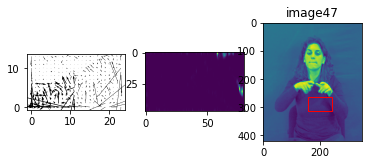

160 264


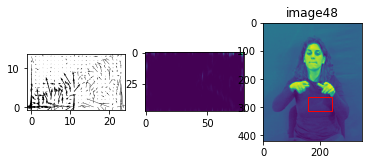

160 264


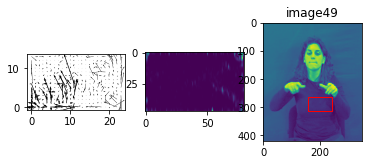

160 264


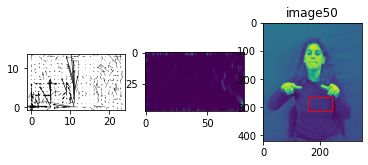

160 263


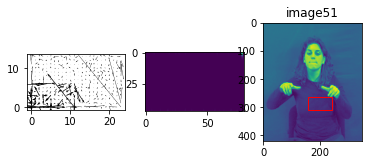

149 263


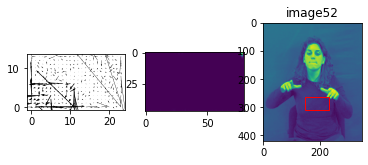

144 265


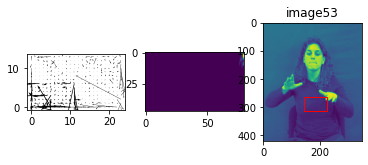

144 268


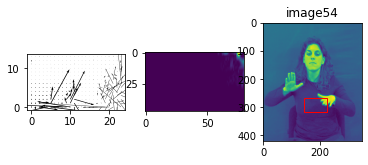

119 264


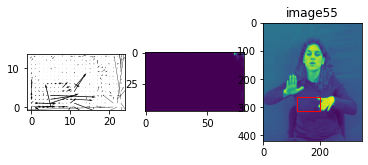

120 273


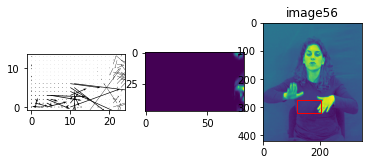

174 274


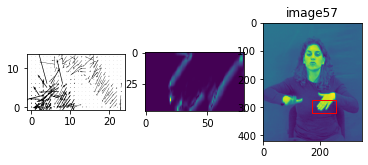

198 262


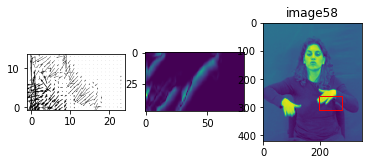

167 268


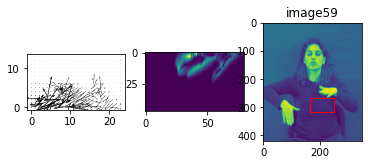

164 268


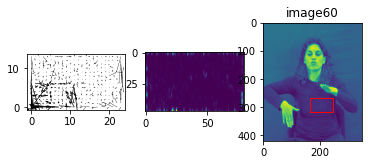

160 264


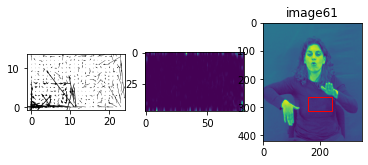

167 258


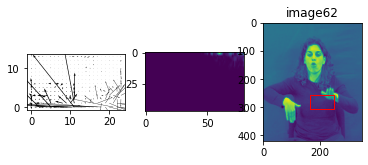

145 264


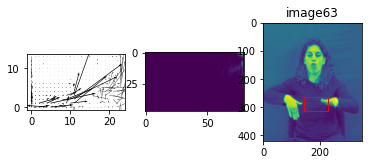

128 269


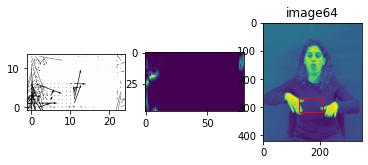

139 261


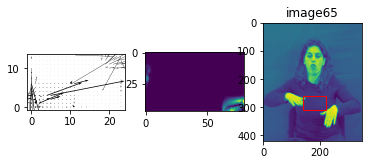

151 261


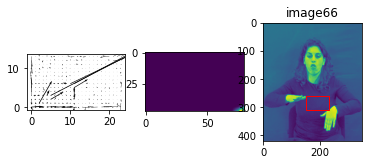

In [275]:
multi_display(right_hand, 4, 10, 0.05, 0.2)